<h1 style='color:orange; text-align:center; font-weight:bold'>Classification-Based Recommendation System for Crop Plantation</h1>

Dataset was obtained from [Kaggle](https://www.kaggle.com/datasets/atharvaingle/crop-recommendation-dataset/data)

## **1 Introduction**
- `N`: ratio of Nitrogen content in soil
- `P`: ratio of Phosphor content in soil
- `K`: ratio of Potassium (or Kalium) content in soil
- `temperature`: temperature in degree Celsius
- `humidity`: relative humidity in %
- `ph`: acidity (pH) value of the soil
- `rainfall`: rainfall in mm

In [132]:
from scipy.stats import skew, kurtosis, shapiro 
import ptitprince as pt
from matplotlib import colormaps
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
plt.style.use('ggplot')
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import scipy.stats as stats

import time
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import hamming_loss, jaccard_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import label_binarize
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.metrics import brier_score_loss

## **2 Data Preparation**
This section is concerned with data import and data cleanliness check. While the data import is straightforward, the data cleanliness check will need to cover examining the dimension of the dataset, column names, including the data types, percentage of missing values and duplicats, and the number of unique values. This series of processes can be done into one step by creating a function for inspecting the dataset. If there are some issues, e.g., the presence of missing values or misidentification of data types, a further investigation needs to be carried further. Otherwise, the steps can be skipped and move on to the next step, i.e., checking the descriptive statistics. This sttaistical test will provide a numerical sense of the data distribution, including distribution-related problems such as incorrect measurements or anomalies.

In [133]:
# import dataset
data = pd.read_csv('../data/Crop_recommendation.csv')

In [134]:
# create function to inspect df
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NAPct': (df.isna().mean() * 100).round(2).tolist(),
        'DuplicatePct': (df.duplicated().sum()/len(df)*100).round(2),
        'UniqueValue': df.nunique().tolist(),
        'Sample': [df[col].unique() for col in df.columns]
    }
    return pd.DataFrame(summary)

# inspect dataframe
print(f'The dataframe contains {data.shape[0]} rows and {data.shape[1]} cols.')
print(f"- {len(data.select_dtypes(include='number').columns)} are numeric cols")
print(f"- {len(data.select_dtypes(include='O').columns)} are object cols")
inspect_dataframe(data)

The dataframe contains 2200 rows and 8 cols.
- 7 are numeric cols
- 1 are object cols


,ColumnName,Nrow,DataType,NAPct,DuplicatePct,UniqueValue,Sample
0,N,2200,int64,0.0,0.0,137,"[90, 85, 60, 74, 78, 69, 94, 89, 68, 91, 93, 7..."
1,P,2200,int64,0.0,0.0,117,"[42, 58, 55, 35, 37, 53, 54, 46, 56, 50, 48, 3..."
2,K,2200,int64,0.0,0.0,73,"[43, 41, 44, 40, 42, 38, 36, 37, 39, 35, 45, 1..."
3,temperature,2200,float64,0.0,0.0,2200,"[20.87974371, 21.77046169, 23.00445915, 26.491..."
4,humidity,2200,float64,0.0,0.0,2200,"[82.00274423, 80.31964408, 82.3207629, 80.1583..."
5,ph,2200,float64,0.0,0.0,2200,"[6.502985292000001, 7.038096361, 7.840207144, ..."
6,rainfall,2200,float64,0.0,0.0,2200,"[202.9355362, 226.6555374, 263.9642476, 242.86..."
7,label,2200,object,0.0,0.0,22,"[rice, maize, chickpea, kidneybeans, pigeonpea..."


**Note**
- As the output shows, the dataset contains 8 columns (7 features and 1 target variable) and 2,200 entries. The number of variables is convenient for including them all during both exploratory data analysis in details and the predictive modeling. The number of rows, however, is relatively small. Small sample size may pose a challenge to a predictive model, especially overfitting. Overfitting problem occurs when the model is more likely to memorize the data instead of learning the underlying patterns and not able to generalize the patterns into new unseen data. This overfitting problem can be diagnosed by comparing the model's performance metrics on training and testing data. If the results indicate a wide gap between performance scores in training adn testing data, the model suffers from overfitting. When this situation happens, a simpler model, e.g., logistic regression or decision tree, can be chosen. And to make the diagnosis more convenient, in addition to using cross-validation, I will also compare different models from different types (e.g., linear-based, distance-based, and tree-based models) and complexity.
- In terms of data types, there are no misidentifications of data types. For this reason, data type conversion will be needed.
- The dataset is clean enough for predictive modeling. It does not contain any missing values and duplicates. It also does not contain any high unique values (high cardinality) because there is no categorical features, except the target variable, in the dataset. The issue of high cardinality will be troublesome for a machine learning model as it can increase the training time (computationally more intensive) and potentially lead to biased predictions over the majority class.

In [135]:
# compute desc stats
data.describe().round(2).transpose()

,count,mean,std,min,25%,50%,75%,max
N,2200.0,50.55,36.92,0.00,21.00,37.00,84.25,140.00
P,2200.0,53.36,32.99,5.00,28.00,51.00,68.00,145.00
K,2200.0,48.15,50.65,5.00,20.00,32.00,49.00,205.00
temperature,2200.0,25.62,5.06,8.83,22.77,25.60,28.56,43.68
humidity,2200.0,71.48,22.26,14.26,60.26,80.47,89.95,99.98
ph,2200.0,6.47,0.77,3.50,5.97,6.43,6.92,9.94
rainfall,2200.0,103.46,54.96,20.21,64.55,94.87,124.27,298.56


**Note**
- Checking from the large standard deviations, nitrogen (`N`), phosphor (`P`), potassium (`K`), and `rainfall` show a relatively wide range of values. Since standard deviation is a measure of spread, a large standard deviation means high spread or variability in dataset. If this problem is left untreated, it can introduce a challenge to a machine learning model, particularly to find out patterns and relationships. This simple statistical test, therefore, informs the need of feature engineering technique to rescale the values. 
- Additionally, comparing the min-max values and the quantile of 25% and 7% gives a valuable insight about the potential presence of outliers. For example there is a large difference between the Q3 and the max value in potassium ratio in soil (`K`). The wide gap indicates a potential presence of outliers. Here, I said "potential" because there are more formal detection on outliers, e.g., using z-score, interquartile range, or Mahalanobis distance.

## **3 Data Exploration**
This exploratory data analysis (EDA) deals with exploring the distribution of the target variable (`label`) and the numerical variable. Exploring the distribution of the target variable will provides an understanding of potential class imbalance problem. This problem is crucial as it may severely affect the model's performance, especially biased towards the majority class, and highlight the requirement of carrying out resampling (e.g., oversampling or undersampling). For the numerical variables, while previously I have conducted a descriptive statistical test, this test is less definitive so more formal tests are needed to investigate the distribution of the numerical features. 

Besides, an exploration on the relationship between variables will also be performed. The exploration will inform what kind of relationships between variables are, whether the relationships will introduce a significant problem to a machine learning model, and what kinds of machine learning models should be icnluded in the predictive modeling after finding out these insights.

### **3.1 Is there any class imbalance problem?**

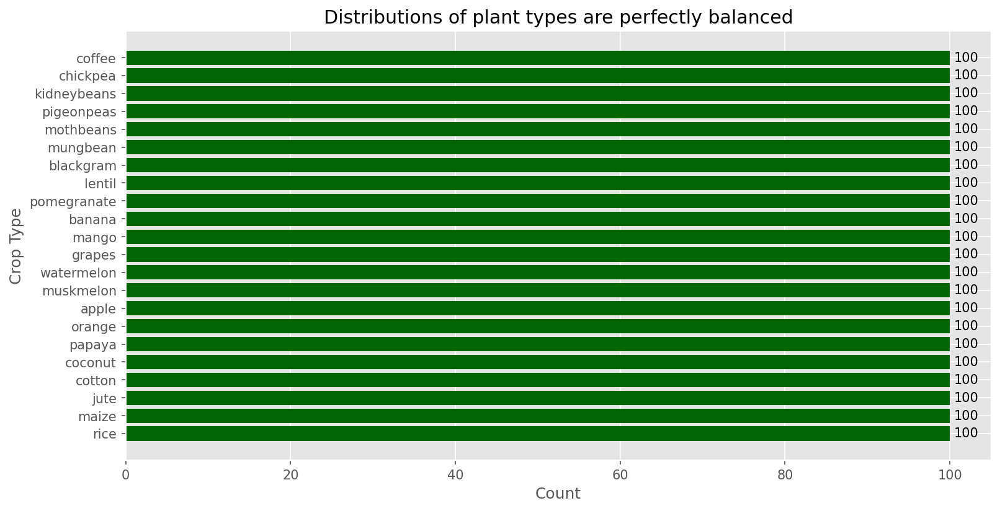

In [136]:
# Count occurrences of each label
plant_df = data['label'].value_counts().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(12, 6), dpi=150)
ax = plt.barh(plant_df['index'], plant_df['count'], color='darkgreen')

for index, value in enumerate(plant_df['count']):
    plt.text(value + 0.5, index, f'{value}', va='center', ha='left')

plt.xlabel('Count')
plt.ylabel('Crop Type')
plt.title('Distributions of plant types are perfectly balanced')
plt.show()

**Note**
- Interestingly, the distributions of crop types in the target variable is perfectly balanced. Most of the time, the target variable contains imbalanced distribution between classes so resampling techniques such as SMOTE (Synthetic Minority Oversampling Technique), ADASYN (Adaptive Synthetic (Oversampling) Technique), or NearMiss should be implemented to balace the distribution in the target variable.
- Because the quality of the target variable is excellent, I will not perform a further test on the distribution of crop types here. Instead, I will check the distribution of numerical features with respect to these categories in later sections.

### **3.2 Do all numerical features follow normal distribution?**

In [137]:
normality_test = []
# iterate over numerical columns
for col in data.select_dtypes(include='number').columns:
    data_feature = data[col].dropna() 

    if len(data_feature) > 1:  
        # calculate statistics
        feature_skewness = skew(data_feature)
        feature_kurtosis = kurtosis(data_feature)
        feature_shapiro_stat, feature_shapiro_p = shapiro(data_feature)
        
        normality_test.append({
            'feature': col,
            'skewness': feature_skewness,
            'kurtosis': feature_kurtosis,
            'w': feature_shapiro_stat,
            'pvalue': feature_shapiro_p,
            'distribution': 'not normal' if feature_shapiro_p < 0.05 else 'normal'
        })

# convert results to df
pd.DataFrame(normality_test).round(4)

,feature,skewness,kurtosis,w,pvalue,distribution
0,N,0.5094,-1.0586,0.9154,0.0,not normal
1,P,1.0101,0.8556,0.9112,0.0,not normal
2,K,2.3735,4.4365,0.6055,0.0,not normal
3,temperature,0.1848,1.2270,0.9821,0.0,not normal
4,humidity,-1.0910,0.2987,0.8664,0.0,not normal
5,ph,0.2837,1.6491,0.9791,0.0,not normal
6,rainfall,0.9651,0.6030,0.9303,0.0,not normal


**Note**
- Before moving forward to the visual examination on the data distribution, I checked the data distribution numerically to give a numerical sense of what the distribution is like. Combining both numerical and visual tests for data distribution is crucial to deeply understand the data spread.
- As shown above, all features exhibit non-normal data distributions according to Shapiro-Wilk test ([Shapiro & Wilk, 1965](http://www.jstor.org/stable/2333709)). The null hypothesis of this statistical test is that data comes from normal distribution so when the *p*-value is lower than the $\alpha$ at 0.05, the conclusion is the data is different from normal distribution. 
- While this statistical test already answered the distribution type, it is important to consider both skewness and kurtosis as well. These two tests inform the patterns of the distribution in a numerical sense. While skewness provides an understanding of the symmetry of the distribution, kurtosis indicates the peakedness or the height of the distribution.
- Based on the output above, the skewness ranges between -1.0 and 2.3 in all numerical features when the ideal skewness value is 0. The negative skewness in humidity tells that the distribution is more skewed to the left. This happens because some lower values pull the mean to the left. In contrast to humidity, other numerical features exhibit positive skewness with the largest skewness value found in potassium (K). This skewness suggests that the distribution of potassium ratio is moderately skewed to the right.
- To confirm these insights from the numerical output, below is the visual test along with the Shapiro-Wilk *W* test results.

Shapiro, S. S., & Wilk, M. B. (1965). An analysis of variance test for normality (complete samples). Biometrika, 52(3-4), 591-611.

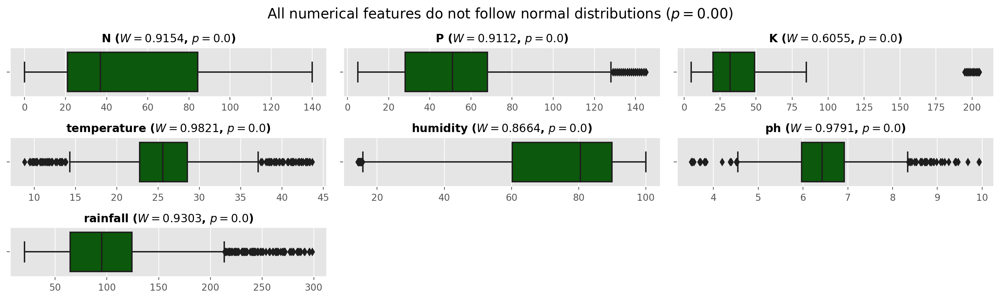

In [138]:
# compute SW test
df_numeric = data.select_dtypes(include='number')
shapiro_results = df_numeric.apply(lambda col: shapiro(col))
stats_df = pd.DataFrame({
    'column': df_numeric.columns,
    'sw_statistic': df_numeric.apply(lambda col: shapiro(col)[0]).values.round(4),
    'sw_pvalues': df_numeric.apply(lambda col: shapiro(col)[1]).values.round(4)
})

# display boxplots
plt.figure(figsize=(15, 7), dpi=200)
for i, col in enumerate(df_numeric.columns):
    plt.subplot(5, 3, i+1)
    sns.boxplot(x=data[col], color='darkgreen')
    # locate H stat and p-val
    row = stats_df[stats_df['column'] == col]
    statistic = row['sw_statistic'].values[0]
    p_value = row['sw_pvalues'].values[0]
    plt.title(f'{col} ($W = {statistic}$, $p = {p_value}$)', size=12, fontweight='bold')
    plt.xlabel(None)
plt.suptitle('All numerical features do not follow normal distributions ($p = 0.00$)', size=15)
plt.tight_layout()
plt.show()

**Note**
- Similar to the numerical test, the visual test also indicates that no numerical features follows normal distribution. This non-normality can be seen by the position of median and the length of the whiskers (lines extending from the box). Normal distribution is characterized by the symmetrical boxplot in which the median line is in the center of the box and the whisker has similar length. But these characteristics cannot be found in the numerical features above.
- Some columns also contain outliers (the dots outside the whiskers) but it remains unclear whether the outliers represent genuine variability within the classes, not errors or anomalies. Evaluating these outliers further, therefore, is required to determine if they are anomalies or real variability. If they are measurement or data entry errors, they can be simply removed or replaced by the measures of centrality (e.g., mean or median values). The choice will depend on, for example, the percentage of the outliers because the higher the rate, the larger the influence of the outliers is to the model. However, if the outliers or the extreme values represent anomalies, some treatments can be the options such as removal, capping/winsorization, or transformation (log transformation or square root transformation).
- Before deciding which treatment is more appropriate, a further check should be done. The next exploration must determine if the outliers are anomalies (just extreme values in some instances) or genuine variability. Genuineness can be determined when there are patterns. For example, the outliers belong to one or more specific classes. These outliers therefore represent genuine variability in the variable and indicate the actual values of the classes.

### **3.3 How many outliers does each feature have?**
In order to detect outliers in the dataset, I will utilize interquartile range (IQR). Unlike z-score detection of outliers, IQR-based detection is less sensitive to outliers since it depends on the quantiles whereas z-score-based detection relies more on mean ($\hat{x}$) and standard deviation ($\sigma$). When the distribution is skewed, mean is less reliable since the outliers affect the mean value. 

$$\text{z score} = \frac{x - \hat{x}}{\sigma}$$


In [139]:
# create function to detect outliers using IQR
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df.loc[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"The number of outliers in '{column}' is {len(outliers)} or {(len(outliers)/len(df)*100):.2f}% of the total data ({len(df)} rows)")

$$
\begin{align}
\text{IQR} &= Q3-Q1 \\
\text{Lower bound} &= Q1 - 1.5 \times IQR \\
\text{Upper bound} &= Q3 + 1.5 \times IQR
\end{align}
$$

In [140]:
# iteratively search for outliers
for i in data.select_dtypes(include='number').columns.tolist():
    detect_outliers(data, i)

The number of outliers in 'N' is 0 or 0.00% of the total data (2200 rows)
The number of outliers in 'P' is 138 or 6.27% of the total data (2200 rows)
The number of outliers in 'K' is 200 or 9.09% of the total data (2200 rows)
The number of outliers in 'temperature' is 86 or 3.91% of the total data (2200 rows)
The number of outliers in 'humidity' is 30 or 1.36% of the total data (2200 rows)
The number of outliers in 'ph' is 57 or 2.59% of the total data (2200 rows)
The number of outliers in 'rainfall' is 100 or 4.55% of the total data (2200 rows)


**Note**
- The output of the iterative outlier detection shows that some columns contain a more than 2% outliers such as phosphor (`P`), potassium (`K`), `temperature`, acidity (`ph`), and `rainfall`. This insight adds previous understanding about the data. Previously, I could only tell there are some outliers in specific columns but here the number and the rate of the outliers are revealed.
- Next I will check what causes the outliers: specific classes (genuine data in specific crop types) or random. To do this exploration I will only check numerical features containing outliers and relate them with the target variable, i.e., `label`. 

#### **3.3.1 What causes the outliers in temperatures?**

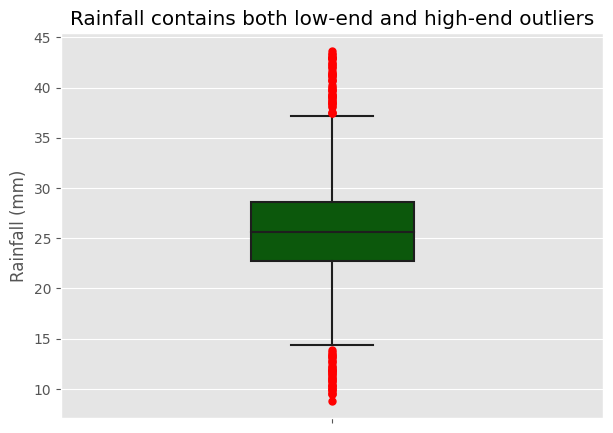

In [141]:
plt.figure(figsize=(7, 5), dpi=100)
sns.boxplot(y=data['temperature'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Rainfall contains both low-end and high-end outliers')
plt.ylabel('Rainfall (mm)')
plt.show()

In [142]:
q1 = data['temperature'].quantile(0.25)
q3 = data['temperature'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
lower_threshold = q1 - 1.5 * iqr
lower_count = data[(data['temperature'] < lower_threshold)]['label'].value_counts()
higher_count = data[(data['temperature'] > upper_threshold)]['label'].value_counts()
print('Outliers in low-end of the distribution:')
display(lower_count.reset_index(name='count'))
print('\nOutliers in high-end of the distribution:')
display(higher_count.reset_index(name='count'))

Outliers in low-end of the distribution:


,index,count
0,grapes,21
1,orange,17



Outliers in high-end of the distribution:


,index,count
0,papaya,35
1,grapes,13


**Note**: As the boxplot above shows outliers are located in the low-end and high-end of the distribution, the numerical test using IQR method was used again to detect what causes outliers. The IQR method also informs that grapes and oranges are the causes of outliers in the low-end; and outliers in the high-end of the distribution are contributed by papayas and grapes. So far, it is possible that grapes are adaptable because it can grow in low to high temperatures. But this is only a half of the insight. To understand further, I will visualize the distribution of temperatures based on crop types. 

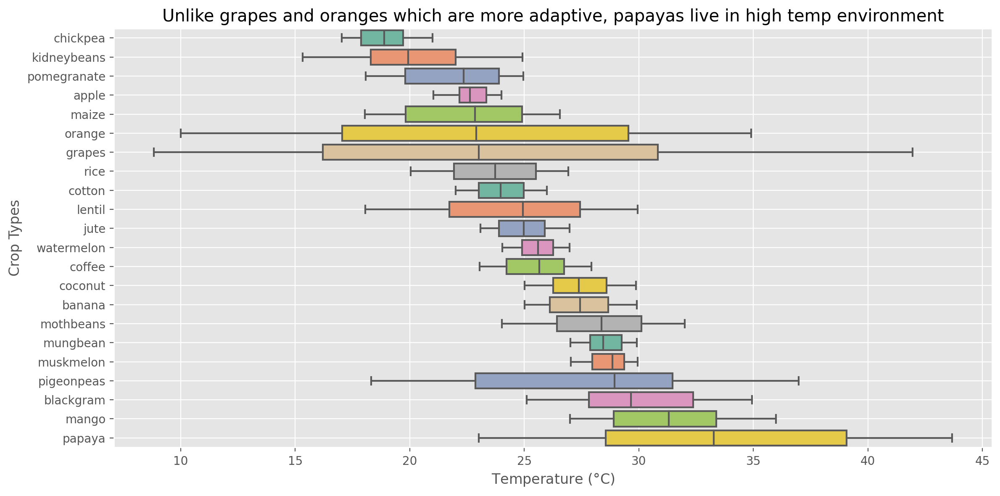

In [143]:
# compare chickpea to other plants
medians = data.groupby('label')['temperature'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='temperature', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Unlike grapes and oranges which are more adaptive, papayas live in high temp environment')
ax.set_xlabel('Temperature ($\degree$C)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**
- Papayas typically live in higher temperatures. As can be seen the range of temperatures in which papayas grow are between approx 23 and 44 degree Celcius. 
- While grapes and oranges which have outliers in the overall temperatures have lower temperatures than papayas, they have wider range of temperatures than papayas, suggesting that they are more adaptable to an environment with varying temperatures.

#### **3.3.2 What causes outliers in rainfall level?**

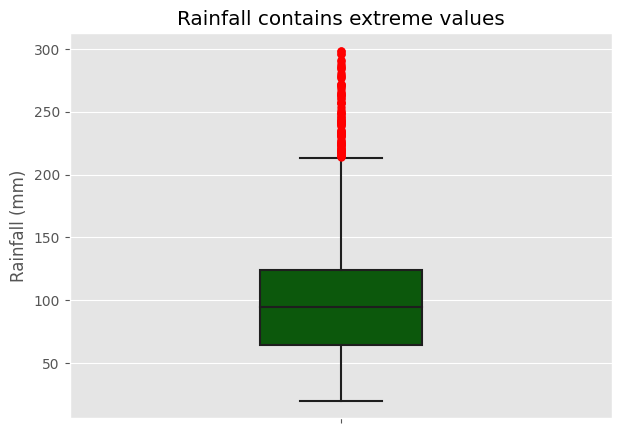

In [144]:
plt.figure(figsize=(7, 5), dpi=100)
sns.boxplot(y=data['rainfall'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Rainfall contains extreme values')
plt.ylabel('Rainfall (mm)')
plt.show()

In [145]:
q1 = data['rainfall'].quantile(0.25)
q3 = data['rainfall'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[(data['rainfall'] > upper_threshold)]['label'].value_counts()

rice       68
papaya     17
coconut    15
Name: label, dtype: int64

**Note**: As the boxplot indicates only on the top-end of the distribution has outliers, I only located crops which are on the upper end of the distribution, namely rice, papayas and coconut. To understand further about the top-end outliers, I will compare these crops with other crops.

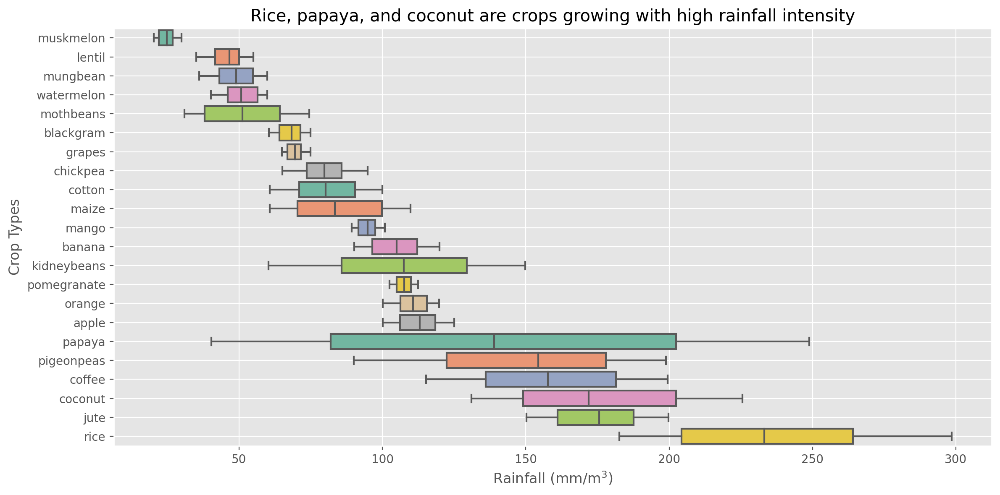

In [146]:
# compare chickpea to other plants
medians = data.groupby('label')['rainfall'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='rainfall', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Rice, papaya, and coconut are crops growing with high rainfall intensity')
ax.set_xlabel('Rainfall (mm/m$^3$)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: The barplots above clarifies why there are outliers in three crop types, namely rice, coconut,and papaya. Based on the data visualization, it is clear that these three crops can grow in an evinronment with high rainfall intensity. Specifically for rice, this crop can grow when the rainfall intensity is between around 180 and 300mm/m-qubic. This is reasonable because rice needs watery environment to grow. The outliers as a consequence represent the genuine data about these crops.

#### **3.3.3 What causes outliers in acidity (pH) level?**

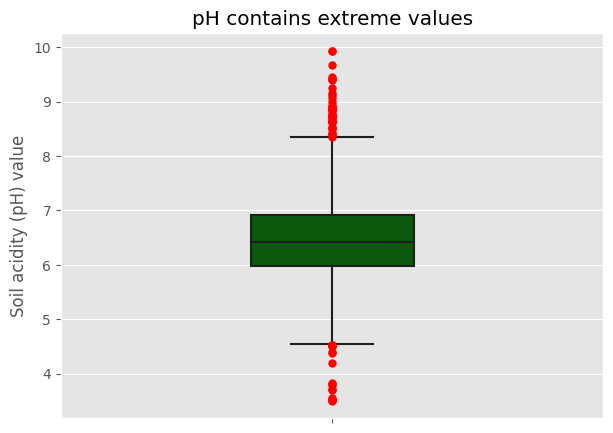

In [147]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['ph'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('pH contains extreme values')
plt.ylabel('Soil acidity (pH) value')
plt.show()

In [148]:
q1 = data['ph'].quantile(0.25)
q3 = data['ph'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
lower_threshold = q1 - 1.5 * iqr
lower_count = data[(data['ph'] < lower_threshold)]['label'].value_counts()
higher_count = data[(data['ph'] > upper_threshold)]['label'].value_counts()
print('Outliers in low-end of the distribution:')
display(lower_count.reset_index(name='count'))
print('\nOutliers in high-end of the distribution:')
display(higher_count.reset_index(name='count'))

Outliers in low-end of the distribution:


,index,count
0,mothbeans,16
1,mango,2



Outliers in high-end of the distribution:


,index,count
0,mothbeans,26
1,chickpea,13


**Note**: The numerical and visual test suggest that the outliers occur in both high and low-end of the distribution of soil acidity. It means that some crops can live in either basic or acidic soil. And as informed by the numerical test, it turns out that only 2 mango plants can live in low pH soil and considering mothbeans show up both in the low and high end outliers, this may suggest that mothbeans can grow in soild with varying acidity level. To check this assumption, I will compare these extreme cases, including mothbeans, to other crops.

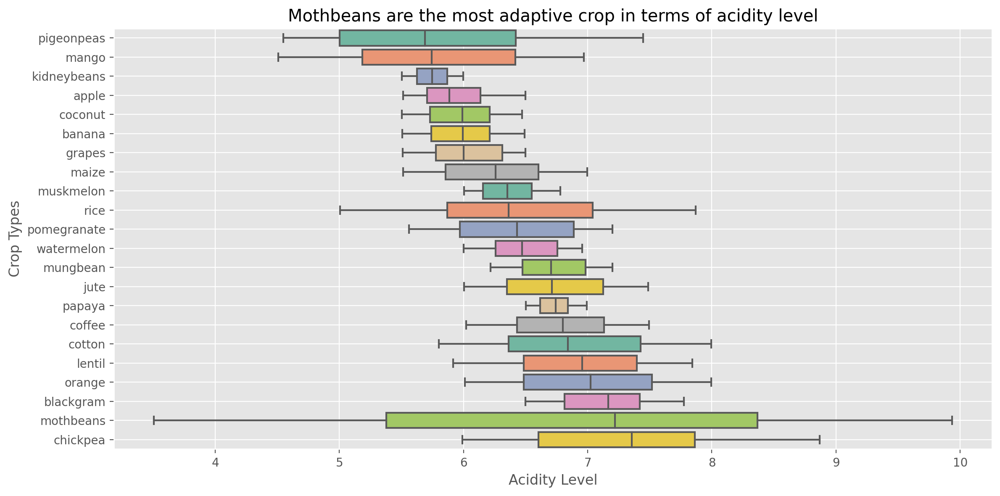

In [149]:
# compare chickpea to other plants
medians = data.groupby('label')['ph'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='ph', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Mothbeans are the most adaptive crop in terms of acidity level')
ax.set_xlabel('Acidity Level')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: In general, all crops typically grow in neutral soil with pH ranging between 6.5 and 7.5 (see range of medians below). Unlike other crops, mothbeans are the most adaptive crop since they can grow in basic soil and acidic soil. Due to their high adaptability to varying levels of acidity, mothbeans can grow in aciditic soil (pH < 7) by up to around 3 yet they can also live in alkaline soil (pH >7).

In [150]:
# compute range of medians in all crops
medians.reset_index(name='median').describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
median,22.0,6.47,0.51,5.69,6.0,6.45,6.83,7.36


#### **3.3.4 What causes outliers in humidity level?**

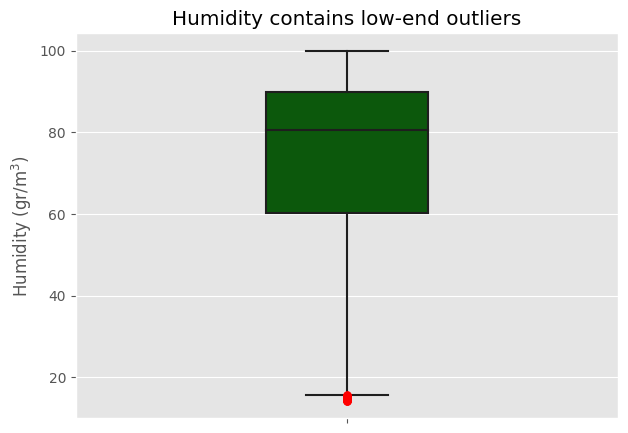

In [151]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['humidity'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Humidity contains low-end outliers')
plt.ylabel('Humidity (gr/m$^3$)')
plt.show()

In [152]:
q1 = data['humidity'].quantile(0.25)
q3 = data['humidity'].quantile(0.75)
iqr = q3 - q1
lower_threshold = q1 - 1.5 * iqr
data[(data['humidity'] < lower_threshold)]['label'].value_counts()

chickpea    30
Name: label, dtype: int64

**Note**: Since the boxplot only indicates the presence of outliers in the low-end of the distribution, I checked only the lower distribution of humidity. This test suggests that there are 30 chickpea plants growing in an environment with low humidity. How extreme the humidity is remains unknown until a comparison between crop types are done.

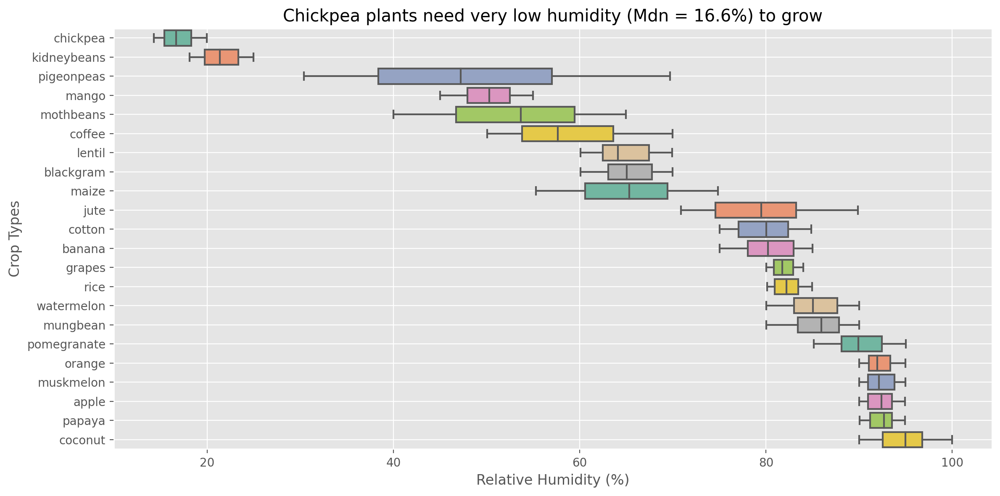

In [153]:
# compare chickpea to other plants
medians = data.groupby('label')['humidity'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='humidity', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Chickpea plants need very low humidity (Mdn = 16.6%) to grow')
ax.set_xlabel('Relative Humidity (%)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: Almost a third number of chickpea plants (30 out of 100 instances) are outliers, and when looking closer to this plant type in the boxplot, it turns out that all chickpeas along with kidneybeans grow in a dry environment. When examining the humidity in general, some chickpeas are outliers but after closely investigating humidity by the crop types, the outliers represent genuine data.

#### **3.3.5 What causes outliers in phosphor?**

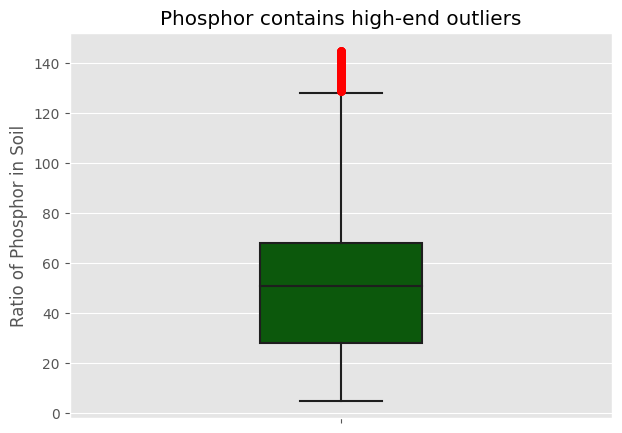

In [154]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['P'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Phosphor contains high-end outliers')
plt.ylabel('Ratio of Phosphor in Soil')
plt.show()

In [155]:
q1 = data['P'].quantile(0.25)
q3 = data['P'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[data['P'] > upper_threshold]['label'].value_counts()

apple     70
grapes    68
Name: label, dtype: int64

**Note**: Out of 100 instances, more than a half instances of either grapes and apples are indicated as high-end outliers, meaning they are considered to grow in an environment with extreme ratio of phosphorous. It raises a question whether the high numbers of outliers represent genuine data similar to chickpeas which are more resistant in a dry environment.

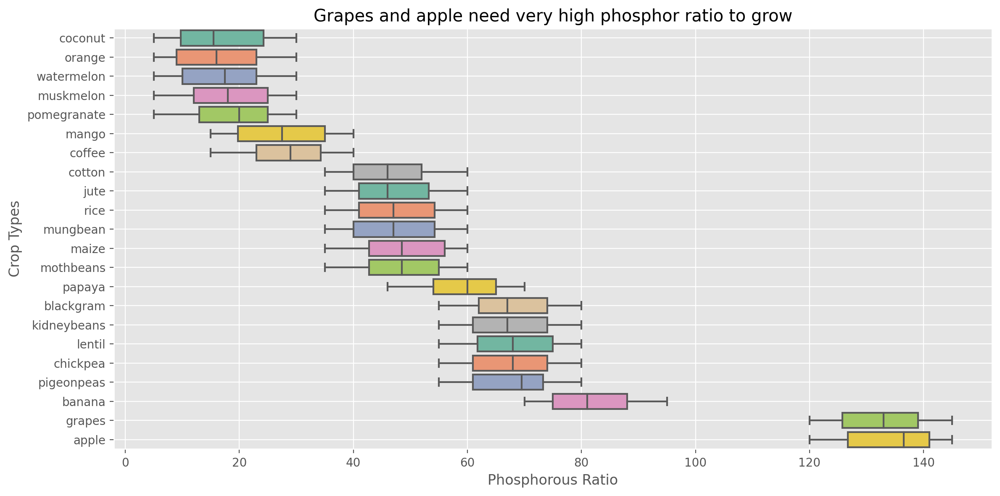

In [156]:
# compare chickpea to other plants
medians = data.groupby('label')['P'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='P', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Grapes and apple need very high phosphor ratio to grow')
ax.set_xlabel('Phosphorous Ratio')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**
- It is interesting that some crops indicate shared patterns in terms of phosphorous ratio. First group represents several crop types with median phosphorous ratios around 20. The second one has median ratios approx 50. The third group with some variability has median phosphorous ratio around 70. And the last group, consisting of only two crop types, i.e., grapes and apples which have outliers, live in areas with high phosphorous ratio.
- Because the variability of the phosphorous ratios as shown by the short whiskers in apples and grapes, these two plants appear to be normally live in such conditions. Alternatively speaking, while previously, more than a half data in these two class were identified as outliers, they represent genuine values in which these two plant types grow.

#### **3.3.6 What causes outliers in potassium ratio in soil?**

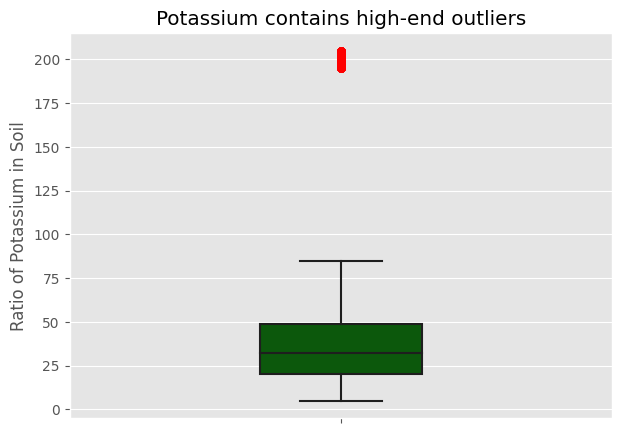

In [157]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['K'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Potassium contains high-end outliers')
plt.ylabel('Ratio of Potassium in Soil')
plt.show()

In [158]:
q1 = data['K'].quantile(0.25)
q3 = data['K'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[data['K'] > upper_threshold]['label'].value_counts()

grapes    100
apple     100
Name: label, dtype: int64

**Note**: Grapes and apples are crop types which appear to be outliers in column potassium (`K`). In a closer examination, all instances falling in these two groups have significantly different potassium ratios required to grow in comparison to the rest crops. 

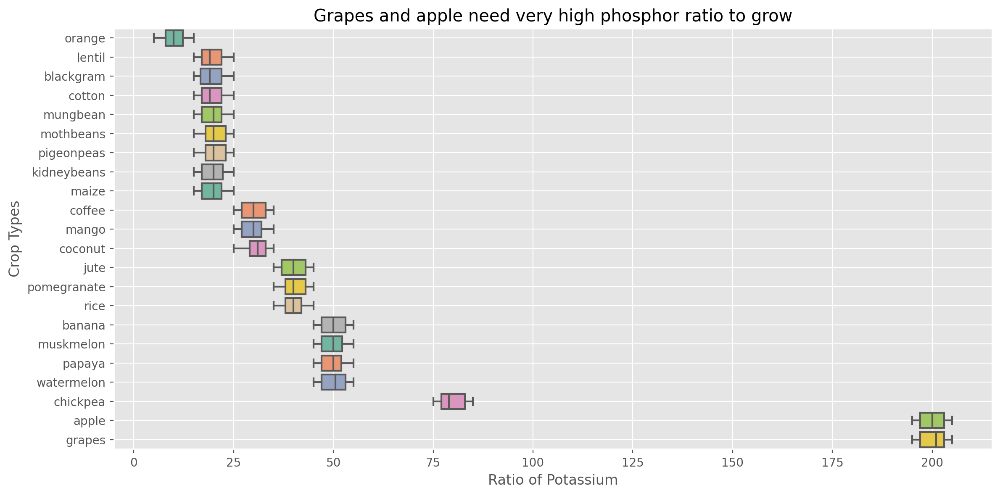

In [159]:
# compare chickpea to other plants
medians = data.groupby('label')['K'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='K', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Grapes and apple need very high phosphor ratio to grow')
ax.set_xlabel('Ratio of Potassium')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: Judging from the boxplot above, ratios of potassium required to grow grapes and apples are very high. These two plants do not only need high phosphorous and high humidity, but they also need high ratio of potassium. Because of these characteristics, these distinct features might distinguish grapes and apples from other crops. Whether this assumption is correct or not will be tested using Principal Component Analysis (PCA) later.

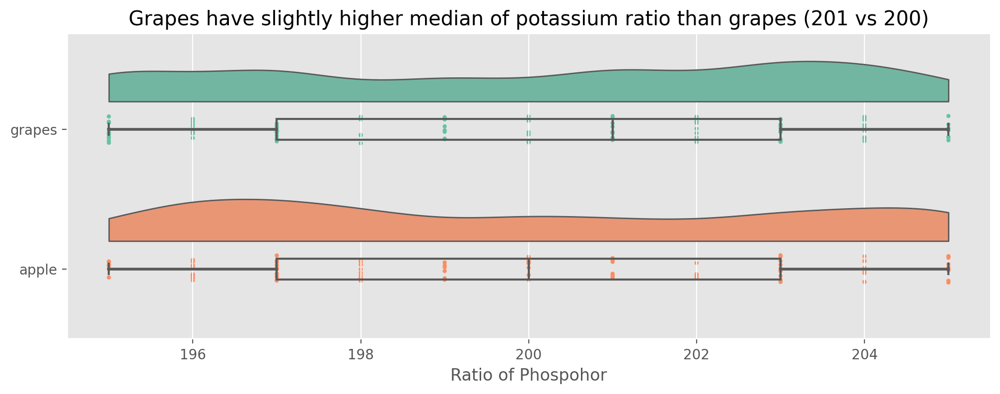

In [160]:
# filter the relevant subset
subset_df = data[data['label'].isin(['apple', 'grapes'])]
medians = subset_df.groupby('label')['K'].median().sort_values(ascending=True)
sorted_labels = medians.index

plt.figure(figsize=(12, 4), dpi=200)
pt.RainCloud(x='label', y='K', data=subset_df, 
             palette='Set2', bw=.2, width_viol=.6, orient='h')
plt.title('Grapes have slightly higher median of potassium ratio than grapes (201 vs 200)')
plt.xlabel('Ratio of Phospohor')
plt.ylabel(None)
plt.show()

### **3.4 Are there any highly correlated or multicollinear features?**

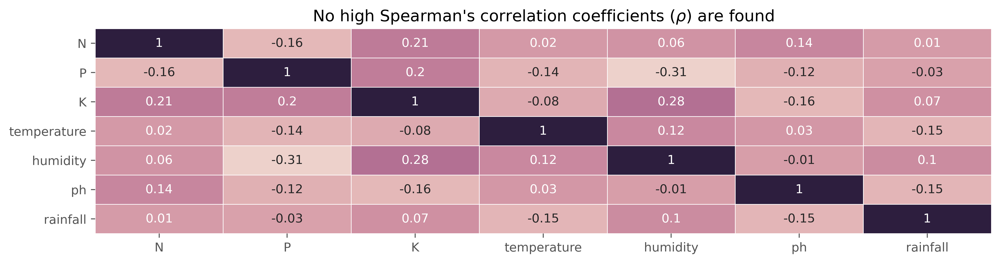

In [161]:
# build spearman correlation matrix
plt.figure(figsize=(13, 3), dpi=400)
correlation_matrix = data.corr(numeric_only=True, method='spearman').round(2)
sns.heatmap(correlation_matrix, annot=True, cmap=sns.cubehelix_palette(as_cmap=True), linewidths=0.5, cbar=False)
plt.title('No high Spearman\'s correlation coefficients ($\\rho$) are found', loc='center', fontsize=13)
plt.show()

**Note**
- The correlation matrix above was computed using Spearman's $\rho$. Spearman's correlation test was chosen over Pearson's $r$ test since the distributions of all numerical features are not normal. Unlike Pearson's correlation test, Spearman's correlation test does not assume normality in the data distribution.
- The correlation matrix suggests that there are no features with high correlation coefficients. The highest coefficient is only 0.31 for the humidity and phosphorous (P) pair.
- The small correlation coefficients across different numerical features might be a result of different possibilities such as small sample size, nonmonotonicity of relationship, and non-linearity. In this context, sample size should not be a culprit since the sample size is adequate for a statistical test but non-monotonous relationship and/or nonlinearity could be the reasons. 
- In short, Spearman's $\rho$ measures whether a bivariate relationship shows a consistent increase or decrease. The inconsistent interval between one data point to another can lead to low $\rho$ value. Additionally, even though Spearman's test captures monotonic relationship, complex relationship (non-linear) can be the other reason too.
- One simple way of testing the relationship between variables is using a scatter plot. But before visualizing the relationships, it is important to remember that Spearman's correlation test is a bivariate relationship test, especially for examining the strength and direction of a bivariate relationship. In order to test multicollinearity, a more formal tool should be used. In this case, I will use Variance Inflation Factor (VIF).

In [162]:
# add intercept for VIF calculation
X = data.select_dtypes(include='number')
X = add_constant(X)

# compute VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data.round(4)

,Feature,VIF
0,const,127.0386
1,N,1.0970
2,P,2.6305
3,K,2.7971
4,temperature,1.1111
5,humidity,1.3690
6,ph,1.0558
7,rainfall,1.0374


**Note**
- In general, VIF values greater or equal to 5 should be avoided. When the values are greater or equal to 5, multicollinearity occurs in the dataset. This multicollinearity will pose a problem to a machine learning model because not only will it reduce the interpretability of the model, multicollinearity makes the coefficient estimate unstable.
    - When two or more predictors are highly correlated, determining the impact of individual predictor to the predictions is difficult. When evaluating a model, we typically look for a unique contribution of each predictor to the prediction but with multicollinearity, this uniqueness is hard to identify.
    - In terms of unstable coefficient estimates, small changes in data can lead to large changes in the coefficients (in linear-based model) or estimated values.
- And if multicollinearity happens, removing one of the highly correlated values can be the option.
- However, as can be seen, there are no VIF values equal to or greater than 5 so no need to drop any features for the predictive modeling process.

### **3.5 Why does the pairwise correlation matrix indicate low coefficients?**

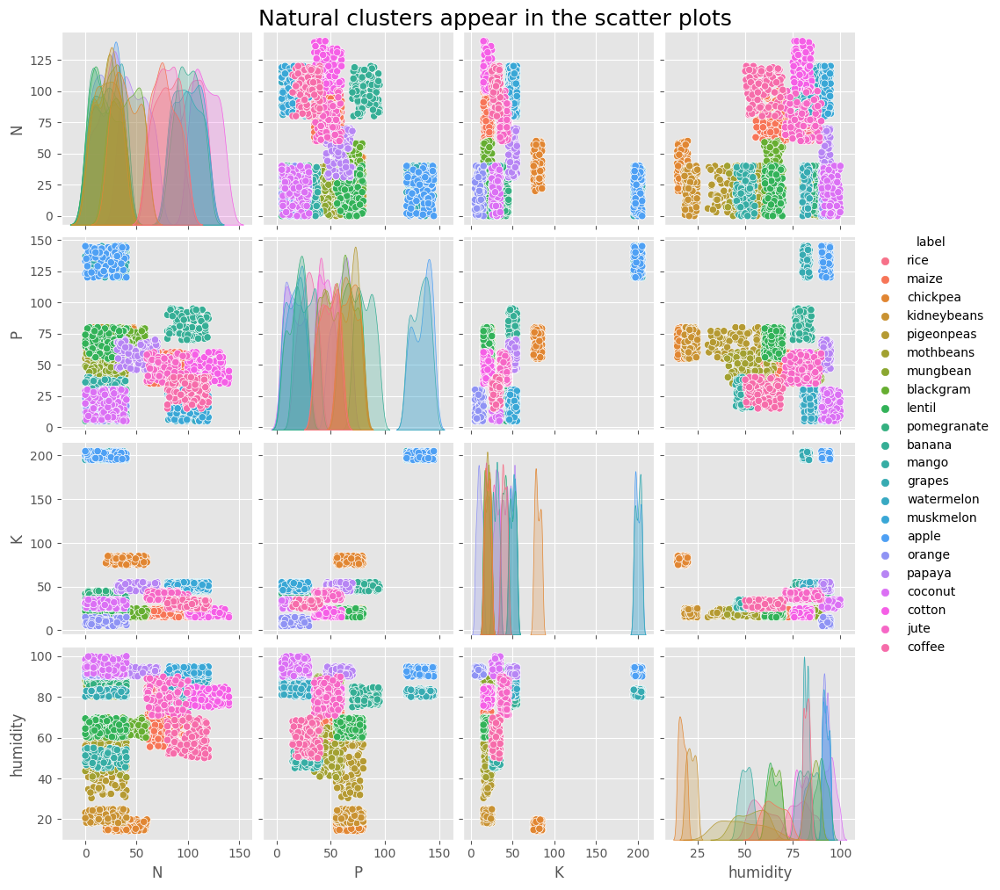

In [170]:
pairplot_data = data[['N', 'P', 'K', 'humidity', 'label']]
sns.pairplot(pairplot_data, hue='label', diag_kind='kde')
plt.suptitle('Natural clusters appear in the scatter plots', y=1.01, size=16)
plt.show()

**Note**
- When testing correlations using Spearman $\rho$, it was found that the highest correlation coefficients (despite their small magnitude (< 0.5)) are between phosphorous and humidity; potassium and humidity; and nitrogen and humidity. The small coefficients between these pairs were suspected to occur due to compex relationship between variables. To test this assumption, I used scatter plots.
- In the scatter plots above, it is shown that these pairs have complex relationships in which the data points are clustered instead of being scattered around the diagonal line. The question of why the highest correlation coefficients have small values has been answered here. But to give more details, I will perform a follow-up analysis on each pair to investigate the natural clusters, providing a more understanding on the patterns of each crop type.

#### **3.5.2 Phosphor vs Humidity**

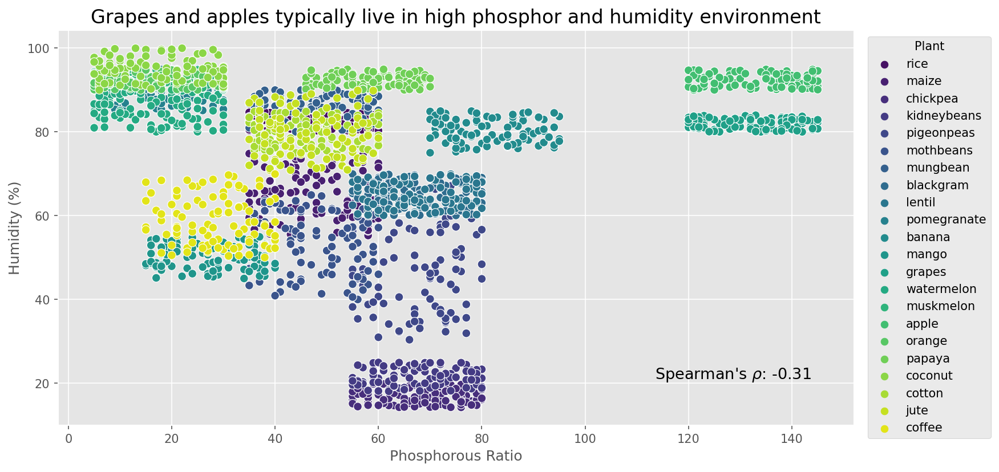

In [182]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['humidity'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='humidity', hue='label', data=data, palette='viridis', s=50)

# coefficient
plt.text(x=0.75, y=0.15, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Humidity (%)')
plt.xlabel('Phosphorous Ratio')
plt.title('Grapes and apples typically live in high phosphor and humidity environment', 
          size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.show()

**Note**: The Spearman's correlation coefficient between phosphorous and humidity is small ($\rho$ = -0.31). This small coefficient is contributed by the complex relationship between these two features. Different plants tend to be clustered, and the data points for grapes and apples indicate the need for high relative humidity and high phosphorous ratio.

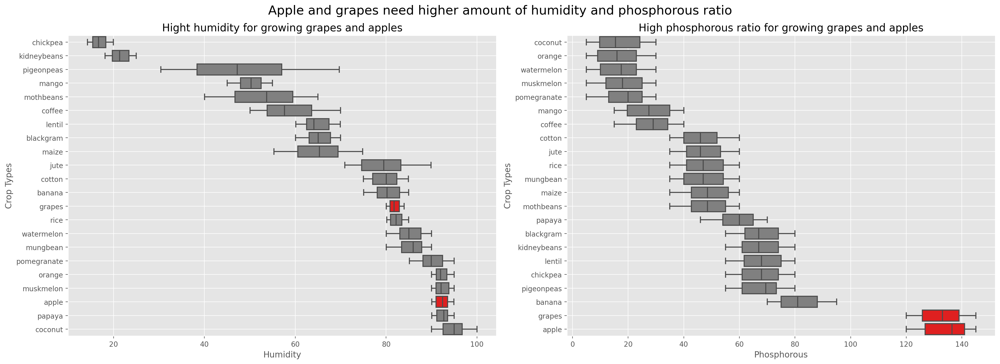

In [200]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# define the color palette
def custom_palette(label):
    if label in ['grapes', 'apple']:
        return 'red'
    else:
        return 'grey'

# ppply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Humidity levels
medians_humidity = data.groupby('label')['humidity'].median().sort_values()
sorted_labels_humidity = medians_humidity.index
sns.boxplot(y='label', x='humidity', data=data, order=sorted_labels_humidity, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight humidity for growing grapes and apples', size=15)
ax1.set_xlabel('Humidity')
ax1.set_ylabel('Crop Types')

# plot 2: Phosphorous ratio
medians_phosphorous = data.groupby('label')['P'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='P', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('High phosphorous ratio for growing grapes and apples', size=15)
ax2.set_xlabel('Phosphorous')
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need higher amount of humidity and phosphorous ratio', size=18, y=1.03)
plt.show()

#### **3.5.1 Phosphor (P) vs Potassium (K)**

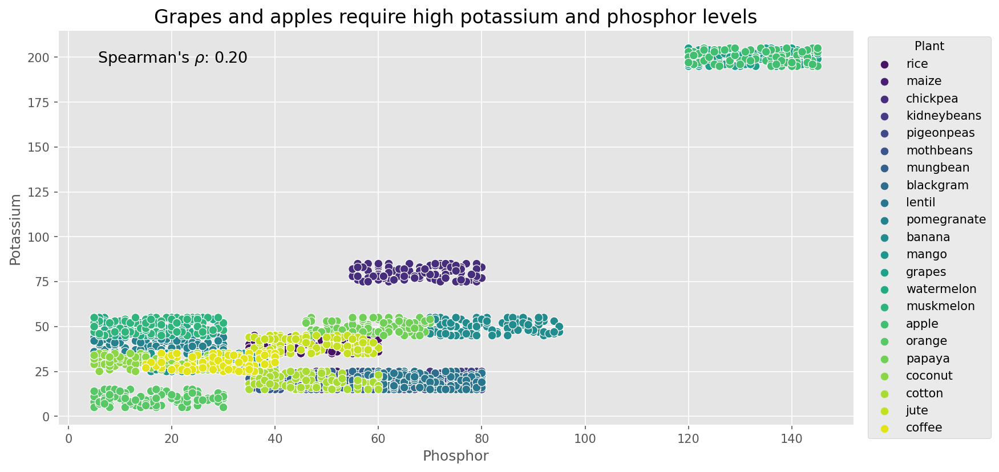

In [117]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['K'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='K', hue='label', data=data, palette='viridis', s=50)
# square = patches.Rectangle((117,190), width=31, height=20, linewidth=1, edgecolor='red', facecolor='none')
# plt.gca().add_patch(square)
# plt.text(x=132, y=184, s='Grapes & Apples', color='red', fontsize=10, ha='center', va='center')

# coefficient
plt.text(x=0.05, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Potassium')
plt.xlabel('Phosphor')
plt.title('Grapes and apples require high potassium and phosphor levels', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.show()

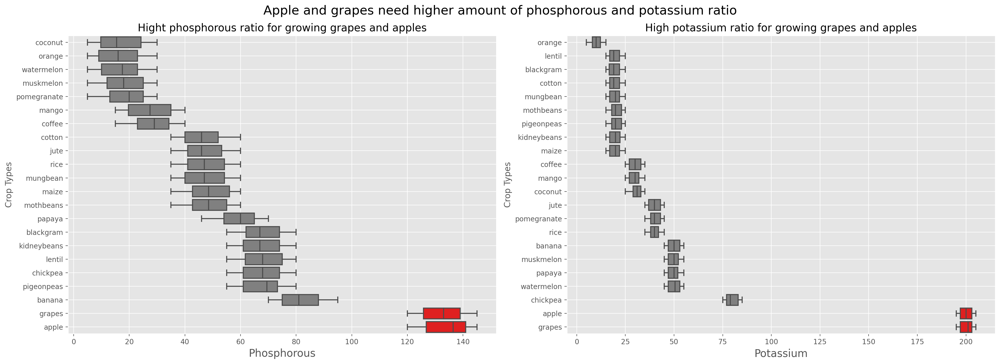

In [202]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# ppply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Phosphorous 
medians_phosphorous = data.groupby('label')['P'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='P', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight phosphorous ratio for growing grapes and apples', size=15)
ax1.set_xlabel('Phosphorous', size=15)
ax1.set_ylabel('Crop Types')

# plot 2: Potassium ratio
medians_potassium= data.groupby('label')['K'].median().sort_values()
sorted_labels_ppotassium = medians_potassium.index
sns.boxplot(y='label', x='K', data=data, order=sorted_labels_ppotassium, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('High potassium ratio for growing grapes and apples', size=15)
ax2.set_xlabel('Potassium', size=15)
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need higher amount of phosphorous and potassium ratio', size=18, y=1.03)
plt.show()

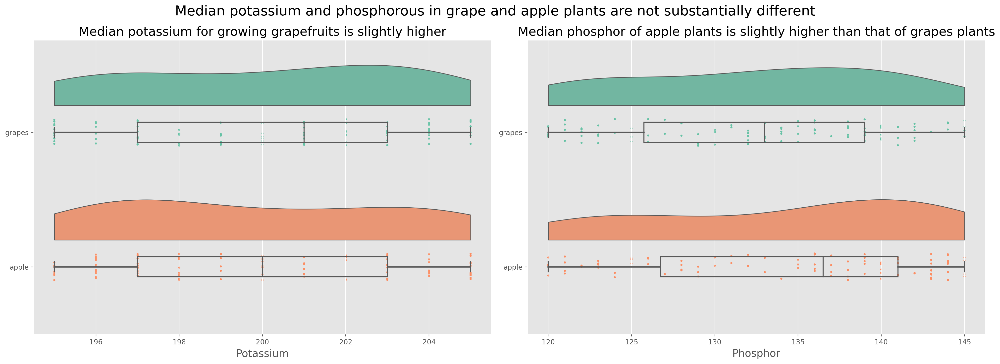

In [218]:
# create a subset of the data for 'grapes' and 'apple'
subset_df = data[data['label'].isin(['grapes', 'apple'])]

# set up the figure with two subplots 
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# plot 1: Potassium distribution
pt.RainCloud(x='label', y='K', data=subset_df, 
             palette='Set2', bw=.5, width_viol=.6, ax=ax1, orient='h')
ax1.set_title('Median potassium for growing grapefruits is slightly higher', size=18)
ax1.set_xlabel('Potassium', size=15)
ax1.set_ylabel(None)

# plot 2: Phosphorous distribution
pt.RainCloud(x='label', y='P', data=subset_df, 
             palette='Set2', bw=.5, width_viol=.6, ax=ax2, orient='h')
ax2.set_title('Median phosphor of apple plants is slightly higher than that of grapes plants', size=18)
ax2.set_xlabel('Phosphor', size=15)
ax2.set_ylabel(None)

plt.tight_layout()
plt.suptitle('Median potassium and phosphorous in grape and apple plants are not substantially different', y=1.04, size=20)
plt.show()

#### **3.8.3 Potassium vs Humidity**

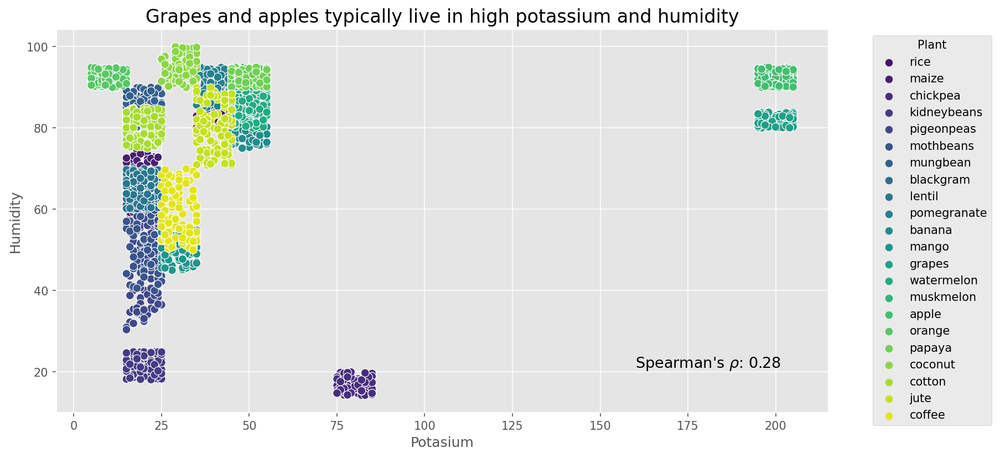

In [45]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['K'], data['humidity'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='K', y='humidity', hue='label', data=data, palette='viridis', s=50)

# coefficient
plt.text(x=0.75, y=0.15, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Humidity')
plt.xlabel('Potasium')
plt.title('Grapes and apples typically live in high potassium and humidity', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

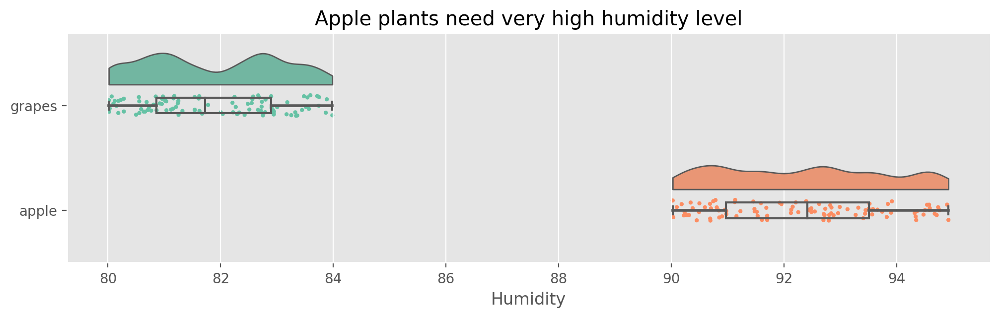

In [217]:
subset_df = data[data['label'].isin(['grapes', 'apple'])]

# set up the figure
plt.figure(figsize=(12, 3), dpi=200)
# use raincloud to display distribution
pt.RainCloud(x='label', y='humidity', data=subset_df, 
             palette='Set2', bw=.2, width_viol=.6, ax=None, orient='h')
plt.title('Apple plants need very high humidity level')
plt.xlabel('Humidity')
plt.ylabel(None)
plt.show()

#### **3.8.4 Nitrogen vs Potassium**

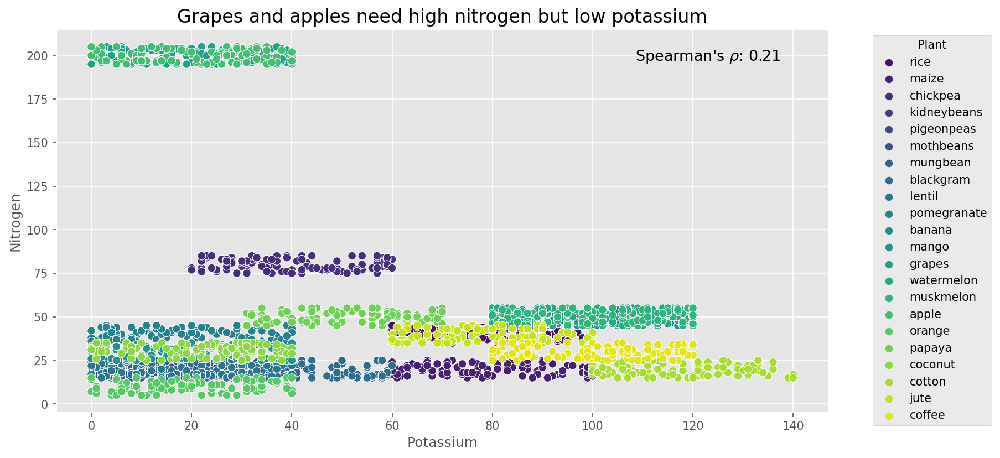

In [47]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['N'], data['K'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='N', y='K', hue='label', data=data, palette='viridis', s=50)

# coefficient
plt.text(x=0.75, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Nitrogen')
plt.xlabel('Potassium')
plt.title('Grapes and apples need high nitrogen but low potassium', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#### **Phosphorous and pH**
As high acidity in soil can limit the availability of nutrients, especially phosphorous, I need to check the correlation between these two.

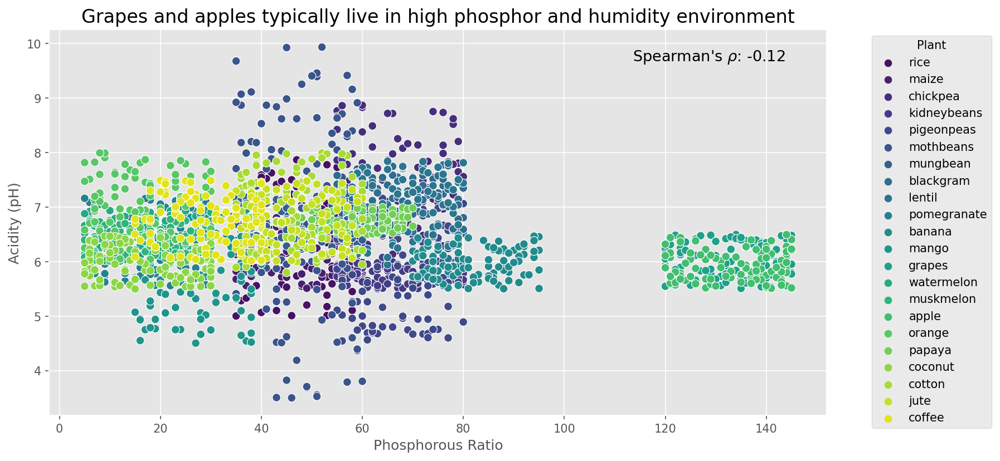

In [112]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['ph'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='ph', hue='label', data=data, palette='viridis', s=50)

# coefficient
plt.text(x=0.75, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Acidity (pH)')
plt.xlabel('Phosphorous Ratio')
plt.title('Grapes and apples typically live in high phosphor and humidity environment', 
          size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### **3.6 Are there any potential anomalies?**
Principal Componant Analysis (henceforth, PCA) is useful in many ways, but most importantly in this exploration purpose, it makes possible visualizing high dimensional data into two dimensional space. By visualizing the reduced dimension, PCA helps in identifying whether there are natural groupings in the data. What I mean by 'natural' is without applying any clustering algorithms (e.g., k-means, DBSCAN, mean-shift, or agglomerative clustering). But it does not mean implementing a clustering algorithm is not beneficial when building a classification-based recommender for crop plantation. Performing clustering can provide a more comprehensive insight on the inherent patterns in the data which is not immediately apparents. On the other hand, to maintain simplicity, I will not perform any clustering in this notebook. I will keep this point to the future development in which clustering can be used as a triangulation tool to validate the classifier. If the recommender is effective enough, the results of the recommender should correspond with the outputs of the clustering.

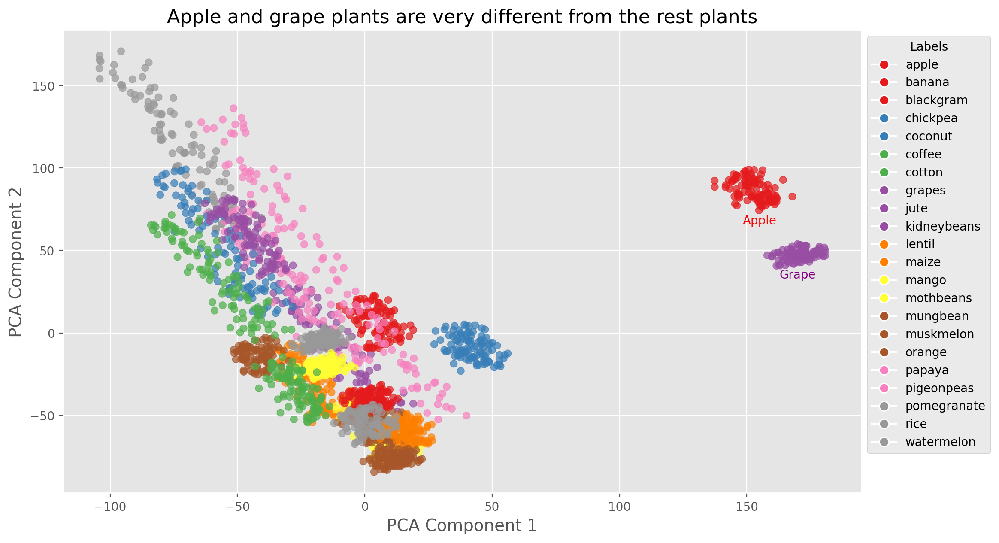

In [48]:
# prepare the data for PCA
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(data['label'])
X = data.select_dtypes(include='number')
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# plot using the encoded label
plt.figure(figsize=(12, 7), dpi=200)
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=encoded_labels, cmap='Set1', alpha=0.7)
# plt.colorbar(scatter)  
plt.title('Apple and grape plants are very different from the rest plants', size=16)
plt.xlabel('PCA Component 1', size=14)
plt.ylabel('PCA Component 2', size=14)

# add a legend
unique_encoded_labels = np.unique(encoded_labels)
legend_labels = label_encoder.inverse_transform(unique_encoded_labels)
handles = [plt.Line2D([0], [0], marker='o', color='w', 
                      markerfacecolor=scatter.cmap(scatter.norm(i)), markersize=8) for i in unique_encoded_labels]
plt.text(x=155, y=68, s='Apple', color='red', fontsize=10, ha='center', va='center')
plt.text(x=170, y=35, s='Grape', color='purple', fontsize=10, ha='center', va='center')
plt.legend(handles, legend_labels, title='Labels', bbox_to_anchor=(1, 1))
plt.show()

**Note**
- Apple and grape plants are celarly separated from other plants, indicating unique characteristics compared to the rest plants. This insight confirms the previous findings about these two plants. For example, grapes and apples need high nitrogen, high humidity, high phosphor, and high potassium.
- Other plants are grouped closer togther, suggesting they share more similar features than differences.

## **4 Predictive Modeling**

In [49]:
# data = pd.read_csv('../data/Crop_recommendation.csv')

In [50]:
# encode target
label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

# define features and target
X = data.drop(columns=['label'])
y = data['label']

# split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'The X_train consists of {X_train.shape[0]} rows and {X_train.shape[1]} columns')
print(f'The y_train consists of {y_train.shape[0]} rows')
print(f'X_test consists of {X_test.shape[0]} rows and {X_test.shape[1]} columns')
print(f'The y_test consists of {y_test.shape[0]} rows')

The X_train consists of 1760 rows and 7 columns
The y_train consists of 1760 rows
X_test consists of 440 rows and 7 columns
The y_test consists of 440 rows


In [51]:
# preprocessor pipeline 
num_cols = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), num_cols)
], remainder='passthrough')

# display preprocessor
display(preprocessor)

ColumnTransformer(remainder='passthrough',
                  transformers=[('num', RobustScaler(),
                                 ['N', 'P', 'K', 'temperature', 'humidity',
                                  'ph', 'rainfall'])])

In [52]:
# specify models for comparison
classifiers = [
    ('Logistic Regression', LogisticRegression(solver='liblinear', random_state=42)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Support Vector Machine', SVC(probability=True)),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('AdaBoost', AdaBoostClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)),
    ('CatBoost', CatBoostClassifier(verbose=0, random_state=42))
]

# assemble everything in a pipeline
pipelines = [(name, Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', model)
])) for name, model in classifiers]

# Scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='macro', zero_division=0),
    'recall': make_scorer(recall_score, average='macro', zero_division=0),
    'f1': make_scorer(f1_score, average='macro', zero_division=0)
}

# Stratified k-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

Using macro because the distribution of classes in the target variable is balanced. It treats each class equally.

### **4.1 Model Comparison**

In [53]:
# evaluate each model
results = []
for name, pipeline in pipelines:
    scores = {}
    start_time = time.time()
    for metric_name, scorer in scoring.items():
        cv_results = cross_validate(pipeline, X_train, y_train, cv=skf, 
                                    scoring=scorer, n_jobs=-1)
        scores[f"{metric_name}"] = np.mean(cv_results['test_score'])
        scores[f"{metric_name}_sd"] = np.std(cv_results['test_score'])
    end_time = time.time()
    training_time = end_time - start_time
    scores['training_time'] = training_time
    results.append((name, scores))

# show in df
results_df = pd.DataFrame(results, columns=['Model', 'Scores'])
scores_df = results_df['Scores'].apply(pd.Series)
results_df = pd.concat([results_df[['Model']], scores_df], axis=1).round(3)
results_df = results_df.set_index('Model')

In [54]:
# display comparison output
results_df.sort_values(by=['f1', 'precision', 'recall'], ascending=False)

,accuracy,accuracy_sd,precision,precision_sd,recall,recall_sd,f1,f1_sd,training_time
Model,,,,,,,,,
Random Forest,0.994,0.003,0.994,0.003,0.994,0.003,0.994,0.003,0.910
CatBoost,0.993,0.003,0.994,0.002,0.993,0.003,0.993,0.003,70.510
Gradient Boosting,0.990,0.001,0.991,0.001,0.990,0.001,0.990,0.001,21.606
XGBoost,0.985,0.002,0.986,0.002,0.985,0.002,0.985,0.002,0.801
Decision Tree,0.985,0.005,0.986,0.004,0.984,0.005,0.984,0.005,0.107
K-Nearest Neighbors,0.982,0.005,0.985,0.004,0.982,0.005,0.982,0.005,0.119
Support Vector Machine,0.982,0.008,0.985,0.007,0.982,0.008,0.982,0.008,0.986
Logistic Regression,0.947,0.007,0.953,0.008,0.946,0.008,0.945,0.008,2.907
AdaBoost,0.165,0.022,0.082,0.012,0.155,0.022,0.094,0.016,0.508


### **4.2 Model Creation**

In [55]:
# build pipelines
rf_clf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

display(rf_clf)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', RobustScaler(),
                                                  ['N', 'P', 'K', 'temperature',
                                                   'humidity', 'ph',
                                                   'rainfall'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [56]:
# perform cross-validation
cv_results = cross_validate(rf_clf, X_train, y_train, cv=skf, 
                            scoring=scoring, return_train_score=True)

# store results in df
dt_score_df = pd.DataFrame({
    'Fold': range(1, skf.get_n_splits() + 1),
    'Train Accuracy': cv_results['train_accuracy'],
    'Test Accuracy': cv_results['test_accuracy'],
    'Train F1 Score': cv_results['train_f1'],
    'Test F1 Score': cv_results['test_f1'],
    'Train Recall': cv_results['train_recall'],
    'Test Recall': cv_results['test_recall'],
    'Train Precision': cv_results['train_precision'],
    'Test Precision': cv_results['test_precision'],
    'TT': cv_results['fit_time']
})

# calculate mean and sd 
mean_accuracy = dt_score_df['Test Accuracy'].mean()
std_accuracy = dt_score_df['Test Accuracy'].std()
mean_f1 = dt_score_df['Test F1 Score'].mean()
std_f1 = dt_score_df['Test F1 Score'].std()
mean_recall = dt_score_df['Test Recall'].mean()
std_recall = dt_score_df['Test Recall'].std()
mean_precision = dt_score_df['Test Precision'].mean()
std_precision = dt_score_df['Test Precision'].std()
mean_tt = dt_score_df['TT'].mean()
std_tt = dt_score_df['TT'].std()

# display the results
display(dt_score_df.round(4))
print("\nMean test accuracy: {:.4f} (Std: {:.4f})".format(mean_accuracy, std_accuracy))
print("Mean test F1 score: {:.4f} (Std: {:.4f})".format(mean_f1, std_f1))
print("Mean test recall: {:.4f} (Std: {:.4f})".format(mean_recall, std_recall))
print("Mean test recall: {:.4f} (Std: {:.4f})".format(mean_precision, std_precision))
print("Mean training time: {:.4f} (Std: {:.4f})".format(mean_tt, std_tt))

,Fold,Train Accuracy,Test Accuracy,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision,TT
0,1,1.0,0.9972,1.0,0.9971,1.0,0.9972,1.0,0.9972,0.2191
1,2,1.0,0.9886,1.0,0.9889,1.0,0.9891,1.0,0.9901,0.1600
2,3,1.0,0.9915,1.0,0.9915,1.0,0.9913,1.0,0.9919,0.1511
3,4,1.0,0.9972,1.0,0.9971,1.0,0.9972,1.0,0.9972,0.1509
4,5,1.0,0.9943,1.0,0.9941,1.0,0.9943,1.0,0.9943,0.1533



Mean test accuracy: 0.9938 (Std: 0.0037)
Mean test F1 score: 0.9937 (Std: 0.0036)
Mean test recall: 0.9938 (Std: 0.0036)
Mean test recall: 0.9941 (Std: 0.0031)
Mean training time: 0.1669 (Std: 0.0294)


In [57]:
# evaluate the model
rf_clf.fit(X_train, y_train)
y_pred = rf_clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       1.00      1.00      1.00        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       1.00      1.00      1.00        17
      cotton       1.00      1.00      1.00        17
      grapes       1.00      1.00      1.00        14
        jute       0.92      1.00      0.96        23
 kidneybeans       1.00      1.00      1.00        20
      lentil       0.92      1.00      0.96        11
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.96      0.98        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       1.00    

### **4.3 Hyperparameter Tuning**

In [58]:
# param_grid = {
#     'classifier__criterion': ['gini', 'entropy'],
#     'classifier__max_depth': [None, 10, 20, 30],
#     'classifier__min_samples_split': [2, 5, 10],
#     'classifier__min_samples_leaf': [1, 2, 4],
#     'classifier__max_features': [None, 'sqrt', 'log2']
# }

f1_scoring = make_scorer(f1_score, average='macro', zero_division=0)

param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# set up GridSearchCV
grid_search = GridSearchCV(rf_clf, param_grid, cv=5, scoring=f1_scoring, n_jobs=-1)
grid_search.fit(X_train, y_train)

# display best parameters and score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation score: {grid_search.best_score_:.4f}")

Best parameters: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 100}
Best cross-validation score: 0.9948


### **4.5 Best Model Evaluation**

#### **4.5.1 Classification Report**

In [59]:
# evaluate the model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       1.00      1.00      1.00        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       1.00      1.00      1.00        17
      cotton       1.00      1.00      1.00        17
      grapes       1.00      1.00      1.00        14
        jute       0.92      1.00      0.96        23
 kidneybeans       1.00      1.00      1.00        20
      lentil       1.00      1.00      1.00        11
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      1.00      1.00        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       1.00    

#### **4.5.2 Hamming Loss**

Performance of classification models for multilabels. 

$$
\text{Hamming Loss}=\frac{1}{N}\sum_{i=1}^N\frac{1}{L}\sum_{j=1}^L 1_{\{y_{i,j} \ne \hat{y}_{i,j}\}}
$$

In [60]:
# calculate Hamming Loss
print("Hamming Loss:", round(hamming_loss(y_test, y_pred), 4))

Hamming Loss: 0.0045


#### **4.5.3 Confusion Matrix**

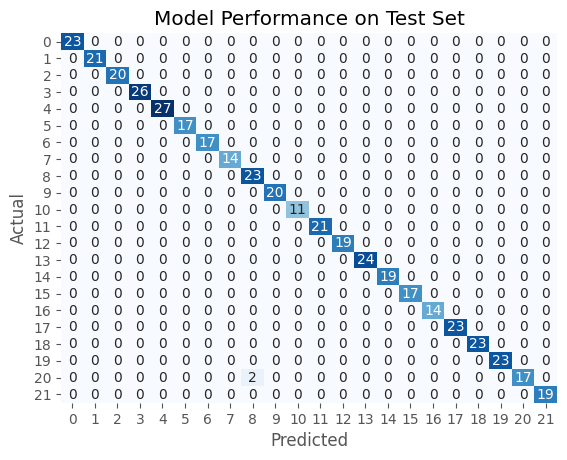

In [61]:
y_pred_dt = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_dt)
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues', cbar=False)

ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Model Performance on Test Set')
plt.show()

In [62]:
label_df = pd.read_csv('../data/Crop_recommendation.csv', usecols=['label'])
label_df['label_enc'] = label_encoder.fit_transform(label_df['label'])
label_df = label_df.drop_duplicates(keep='first').sort_values(by='label_enc')
label_df

,label,label_enc
1500,apple,0
1000,banana,1
700,blackgram,2
200,chickpea,3
1800,coconut,4
2100,coffee,5
1900,cotton,6
1200,grapes,7
2000,jute,8
300,kidneybeans,9


#### **4.5.4 Learning Curve**

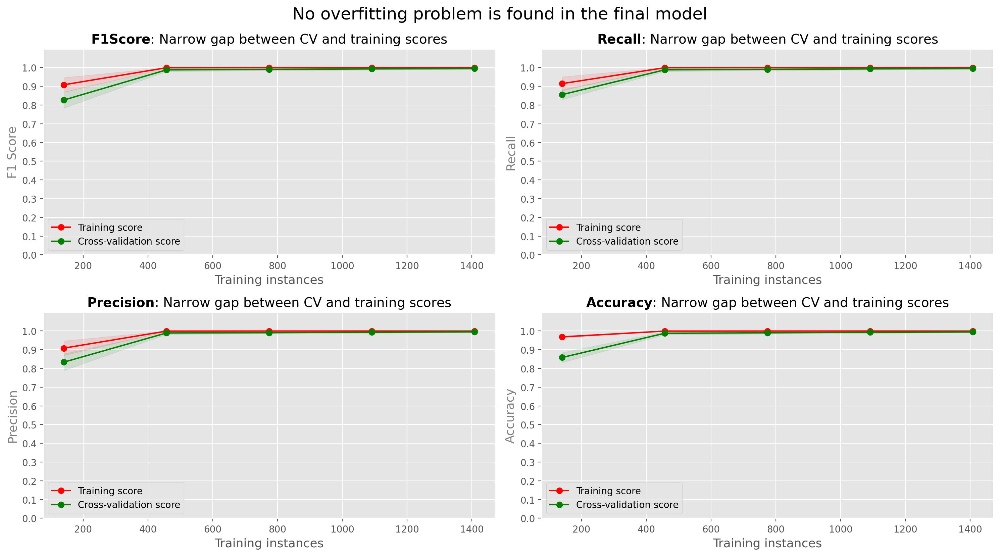

In [63]:
# define scorers
scoring = {
    'F1 Score': make_scorer(f1_score, average='macro', zero_division=0),
    'Recall': make_scorer(recall_score, average='macro', zero_division=0),
    'Precision': make_scorer(precision_score, average='macro', zero_division=0),
    'Accuracy': make_scorer(accuracy_score)
}

# init the figure and axis array
fig, axes = plt.subplots(2, 2, figsize=(15, 8), dpi=200)
axes = axes.ravel()  

# loop through each metric
for i, (metric_name, scorer) in enumerate(scoring.items()):
    train_sizes, train_scores, test_scores = learning_curve(
        best_model, X_train, y_train, cv=5, scoring=scorer, n_jobs=-1)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1, color="r")
    axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1, color="g")
    axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    axes[i].set_xlabel('Training instances', size=13)
    axes[i].set_ylabel(metric_name, size=13, color='grey')
    axes[i].set_title(rf'$\bf{{{metric_name}}}$: Narrow gap between CV and training scores', size=14)
    axes[i].legend(loc="best")
    axes[i].set_ylim(0, 1.1)
    axes[i].set_yticks(np.arange(0, 1.1, 0.1))

plt.tight_layout()
plt.suptitle('No overfitting problem is found in the final model', 
             y=1.03, size=18)
plt.show()


#### **4.5.5 Reliability Curve**

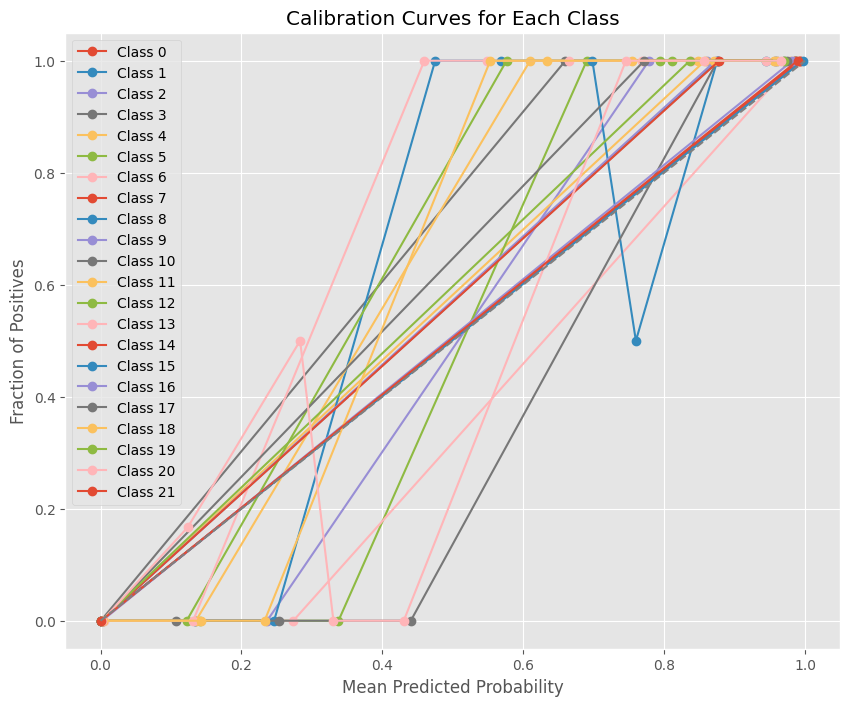

In [64]:
y_pred_proba = best_model.predict_proba(X_test)

# binarize the y_test for multiclass
y_test_binarized = label_binarize(y_test, classes=best_model.classes_)

# plot calibration curve for each class
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(best_model.classes_):
    prob_true, prob_pred = calibration_curve(y_test_binarized[:, i], y_pred_proba[:, i], n_bins=10)
    
    plt.plot(prob_pred, prob_true, marker='o', label=f'Class {class_label}')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curves for Each Class')
plt.legend(loc='best')
plt.show()

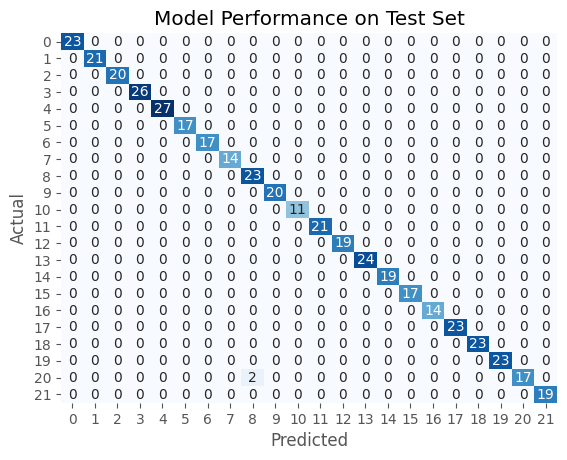

In [65]:
y_pred_dt = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_dt)
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues', cbar=False)

ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Model Performance on Test Set')
plt.show()

In [66]:
# # Predict probabilities
# y_pred_proba = best_model.predict_proba(X_test)

# # For multi-class classification
# brier_scores = [brier_score_loss(y_test[:, i], y_pred_proba[i][:, 1]) for i in range(y_test.shape[1])]
# average_brier_score = np.mean(brier_scores)

# print(f'Brier Scores per class: {brier_scores}')
# print(f'Average Brier Score: {average_brier_score:.2f}')

brier score here

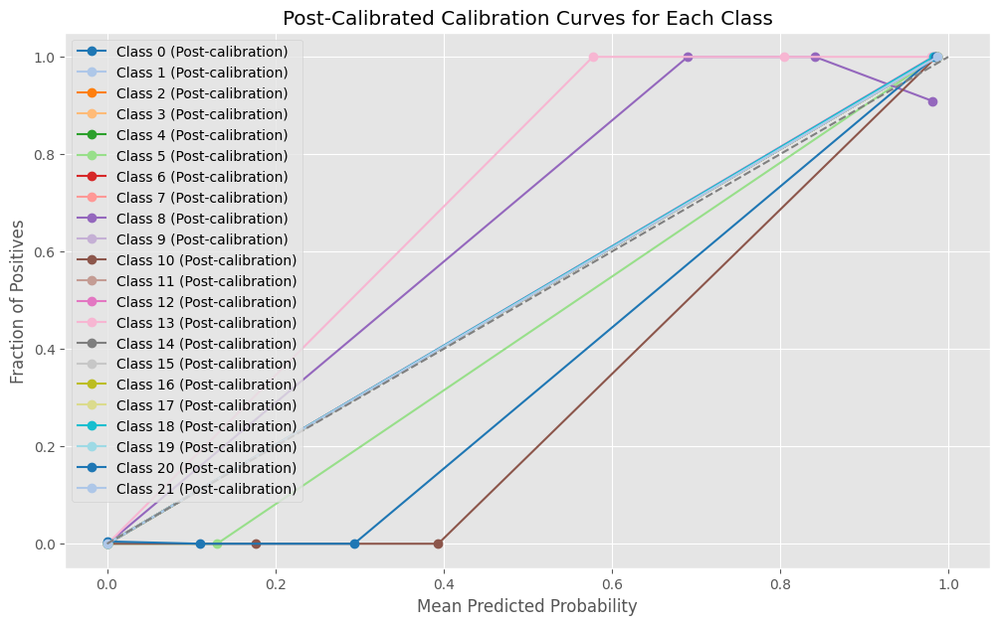

In [67]:
# calibrate the model
calibrated_model = CalibratedClassifierCV(estimator=best_model, method='sigmoid', cv='prefit')
calibrated_model.fit(X_train, y_train)

# predict post-calibrated probabilities on the test set
y_pred_proba_calibrated = calibrated_model.predict_proba(X_test)

# binarize the y_test for multiclass calibration curve
y_test_binarized = label_binarize(y_test, classes=best_model.classes_)

# define a colormap
cmap = plt.get_cmap('tab20')

# plot post-calibration calibration curve for each class
plt.figure(figsize=(12, 7))
for i, class_label in enumerate(best_model.classes_):
    color = cmap(i % 20)
    prob_true, prob_pred = calibration_curve(y_test_binarized[:, i], y_pred_proba_calibrated[:, i], n_bins=10)
    
    plt.plot(prob_pred, prob_true, marker='o', label=f'Class {class_label} (Post-calibration)', color=color)

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Post-Calibrated Calibration Curves for Each Class')
plt.legend(loc='upper left')
plt.show()

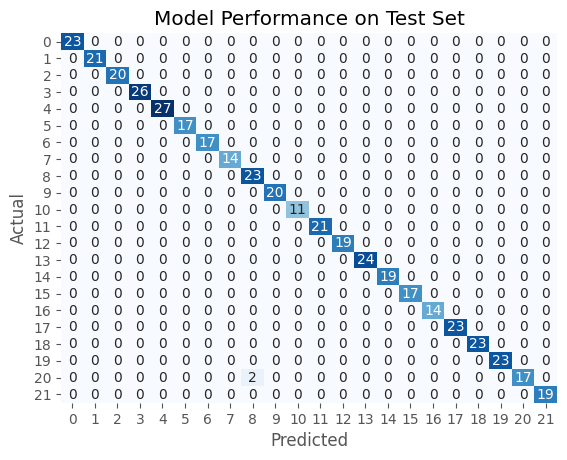

In [68]:
y_pred_dt = calibrated_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_dt)
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues', cbar=False)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Model Performance on Test Set')
plt.show()

In [69]:
# display labels for interpeting output
display(label_df)

,label,label_enc
1500,apple,0
1000,banana,1
700,blackgram,2
200,chickpea,3
1800,coconut,4
2100,coffee,5
1900,cotton,6
1200,grapes,7
2000,jute,8
300,kidneybeans,9


#### **4.5.6 Misclassification Analysis**

In [70]:
# predicts on test set & get pred proba
y_pred = calibrated_model.predict(X_test)
y_prob = calibrated_model.predict_proba(X_test)

# convert y_pred and y_test to series
y_pred_series = pd.Series(y_pred, index=X_test.index, name='Predicted')
y_test_series = pd.Series(y_test, index=X_test.index, name='Actual')

# store y_prob to df
prob_df = pd.DataFrame(y_prob, columns=[f'Prob_{label}' for label in range(y_prob.shape[1])], index=X_test.index)

# convert series to df and concat with prob_df
predictions_df = pd.DataFrame({
    'Index': X_test.index,  
    'Actual': y_test_series,
    'Predicted': y_pred_series
})
predictions = pd.concat([predictions_df, prob_df], axis=1).round(3)

# display
display(predictions.head())

,Index,Actual,Predicted,Prob_0,Prob_1,Prob_2,Prob_3,Prob_4,Prob_5,Prob_6,...,Prob_12,Prob_13,Prob_14,Prob_15,Prob_16,Prob_17,Prob_18,Prob_19,Prob_20,Prob_21
1451,1451,15,15,0.001,0.001,0.001,0.001,0.001,0.001,0.001,...,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001,0.001,0.001
1334,1334,21,21,0.001,0.001,0.001,0.001,0.001,0.001,0.001,...,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.987
1761,1761,17,17,0.001,0.001,0.001,0.001,0.001,0.001,0.001,...,0.001,0.001,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001
1735,1735,17,17,0.001,0.001,0.001,0.001,0.001,0.001,0.001,...,0.001,0.001,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001
1576,1576,0,0,0.987,0.001,0.001,0.001,0.001,0.001,0.001,...,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001


In [71]:
# show mispredictions
misclassifications = predictions[predictions['Actual'] != predictions['Predicted']]
misclassifications.loc[:, ['Actual', 'Predicted', 'Prob_8', 'Prob_20']]

,Actual,Predicted,Prob_8,Prob_20
65,20,8,0.980,0.007
13,20,8,0.946,0.041


**Note**: Rice (label: 20) is misclassified as Jute (label: 8) for two times. 

In [72]:
# display labels for interpeting output
display(label_df)

,label,label_enc
1500,apple,0
1000,banana,1
700,blackgram,2
200,chickpea,3
1800,coconut,4
2100,coffee,5
1900,cotton,6
1200,grapes,7
2000,jute,8
300,kidneybeans,9


### **4.6 Best Model Explanation**

In [73]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

#### **4.6.1 Tree Plot**
Since random forest is basically a tree-based algorithm, below I display the tree to illustrate the decision process. However, there are several points to consider. (1) Randm forest comprises of many decision trees. Displaying the trees may not be informative enough to understand the overall model as what is displayed is only one among many trees in the model. As can be seen below, the tree is also lack of interpretability. The tree is a way too complex to interpret. 

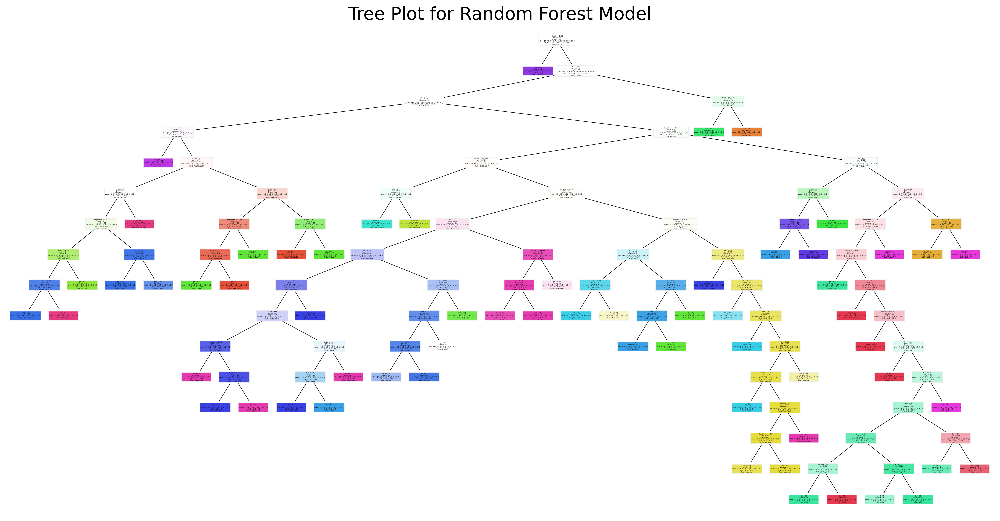

In [74]:
# visualize the first tree
plt.figure(figsize=(20,10), dpi=400)
plot_tree(best_model.named_steps['classifier'].estimators_[0], filled=True, 
          feature_names=X_train.columns, class_names=label_encoder.classes_)
plt.title('Tree Plot for Random Forest Model', size=20)
plt.show()

**Note**: Due to its compexity, I will rely on other explainable AI (XAI) methods to explain the model. The XAI methods, namely coefficient feature importance, Partial Dependence Plot (PDP) and Individual Conditional Expectation (ICE) plot, do not only summarize the general behavior of the model (global explanation), they can also explain the how the model makes a decision on the instance level (local explanation)

#### **4.6.2 Coefficient Feature Importance**

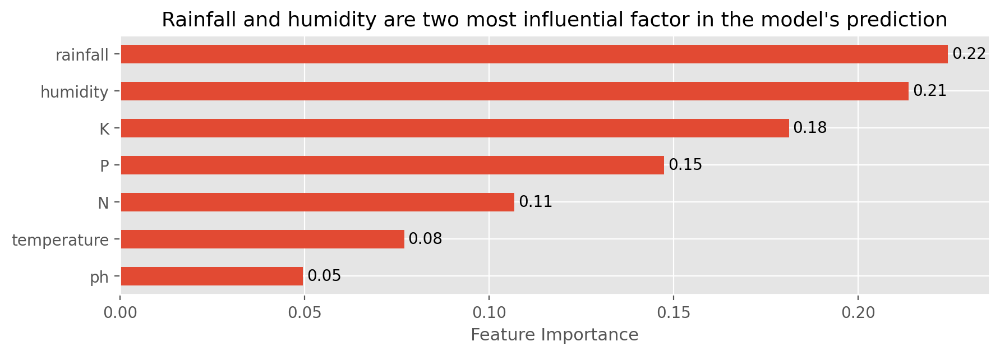

In [75]:
# prepare data
feature_names = X_train.columns
importances = pd.Series(best_model.named_steps['classifier'].feature_importances_, index=feature_names)
importances_sorted = importances.sort_values()

# plot coefficient
plt.figure(figsize=(10, 3), dpi=200)
ax = importances_sorted.plot(kind='barh')

# add labels to each bar
for i in ax.patches:
    ax.text(i.get_width() + 0.001, i.get_y() + i.get_height()/2, f'{i.get_width():.2f}', 
            va='center', ha='left')

plt.xlabel('Feature Importance', size=11)
plt.title('Rainfall and humidity are two most influential factor in the model\'s prediction', size=13)
plt.show()

**Note**
- Based on the feature importance, `rainfall` and `humidity` are top-two features showing the most significant impact to the model's predictions. As can be seen when the coefficients of other features range between 0.05 and 0.21, these two environmental factors give substantial influence over the predictions.
- While coefficient-based feature importance shows the greatest influence on the model's predictions, this only provides a half of the story. It only offer a global explanation on how the model makes a prediction. Alternatively saying, this feature importance informs general behavior of the model.
- To gain a deeper understanding of how the features affect the model's predictions, I will use Partial Dependence Plot (PDP) and Individual Conditional Expectation (ICE) Plot. 

#### **4.6.3 Partial Dependence and Individual Conditional Expectation Plot**
In order to understanding how the model behaves, especially using the most significant features on the predictions, namely rainfall and humidity, partial dependence plot (PDP) and individual conditional expectation (ICE) plot will be utilized. In general, PDP (<span style='color:orange'>orange dashed line</span>) represents the overall relationship between the two features and the predictions. The ICE plot, on the other hand, displays information about the variability of predictions for different instances (<span style='color:lightblue'>light blue lines</span>). These two lines can be visualized at once, providing a more complete picture about how two most significant features affect the model's predictions.

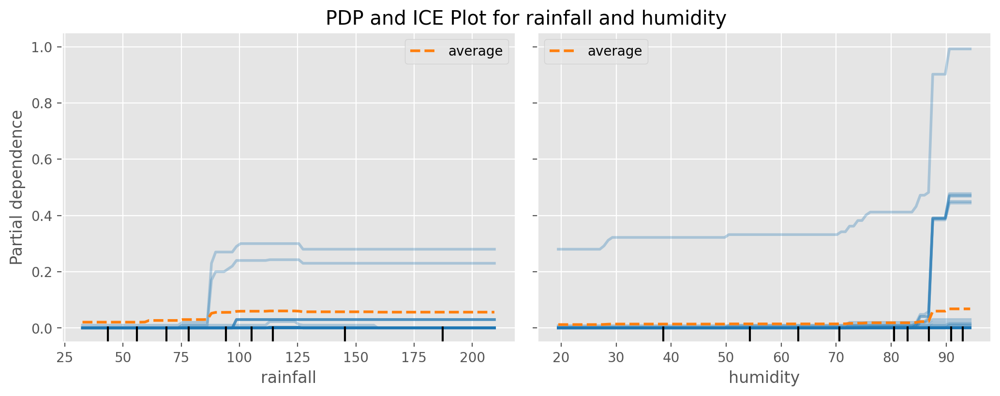

In [76]:
fig, ax = plt.subplots(figsize=(12, 4), dpi=200)

# create PDP and ICE plot with adjusted subsample
PartialDependenceDisplay.from_estimator(
    best_model, X_train, ['rainfall', 'humidity'], 
    kind='both', 
    target=0, 
    subsample=50, 
    ax=ax, 
    line_kw={'linewidth': 2},        
    ice_lines_kw={'linewidth': 2})

# set the title
ax.set_title('PDP and ICE Plot for rainfall and humidity')
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.05, hspace=0.3)

plt.show()

**Note**:
- The plots indeed summarize how rainfall and humidity affect the model’s predictions. The <span style='color:orange'>orange dashed line</span> (PDP) shows the average effect of these features on the model’s predictions.
- Higher humidity or rainfall generally increases the partial dependence, meaning the model’s predictions are more favorable for certain crops as these values rise.
- The <span style='color:lightblue'>light blue lines</span> (ICE) show how individual predictions vary with changes in rainfall and humidity. Some crops are indeed more sensitive to these changes, indicating that not all crops respond the same way.
- While the ICE lines show variability, they generally follow the trend of the PDP, suggesting more stable predictions as rainfall and humidity increase.

#### **4.6.4 Local Explanation**

## **5 References**

<h1 style='color:orange; text-align:center; font-weight:bold'>---END---<h1>

___

In [77]:
import dice_ml
import random
from dice_ml import Dice
import shap
shap.initjs()

In [78]:
# combine X_test and y_test
df_seen = pd.concat([X_test, y_test], axis=1)
df_seen.head()

,N,P,K,temperature,humidity,ph,rainfall,label
1451,101,17,47,29.494014,94.729813,6.185053,26.308209,15
1334,98,8,51,26.179346,86.522581,6.259336,49.430510,21
1761,59,62,49,43.360515,93.351916,6.941497,114.778071,17
1735,44,60,55,34.280461,90.555616,6.825371,98.540477,17
1576,30,137,200,22.914300,90.704756,5.603413,118.604465,0


In [79]:
# locate first instance and label 15
display(X_test.iloc[[0], :])
display(label_df[label_df['label_enc'] == 15])

,N,P,K,temperature,humidity,ph,rainfall
1451,101,17,47,29.494014,94.729813,6.185053,26.308209


,label,label_enc
1400,muskmelon,15


In [80]:
# setup kernel explainer
explainer = shap.KernelExplainer(best_model.named_steps['classifier'].predict_proba, X_train)

# compute shap values
shap_values = explainer.shap_values(X_test.iloc[0, :])

# display force plot
shap.force_plot(explainer.expected_value[0], shap_values[:, 0], X_test.iloc[0, :])

Using 1760 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [81]:
# # apply preprocessing to get the transformed feature names
# X_train_transformed = preprocessor.fit_transform(X_train)
# X_test_transformed = preprocessor.transform(X_test)

# # get feature names
# def get_unique_feature_names(preprocessor):
#     feature_names = []
#     for name, transformer, columns in preprocessor.transformers_:
#         if hasattr(transformer, 'named_steps'):
#             steps = transformer.named_steps
#             if 'cat' in steps and hasattr(steps['cat'], 'get_feature_names_out'):
#                 feature_names.extend(steps['cat'].get_feature_names_out(columns))
#             else:
#                 feature_names.extend(columns)
#         elif hasattr(transformer, 'get_feature_names_out'):
#             feature_names.extend(transformer.get_feature_names_out(columns))
#         else:
#             feature_names.extend(columns)
#     return feature_names

# unique_feature_names = get_unique_feature_names(preprocessor)

In [82]:
# # create a SHAP TreeExplainer
# explainer = shap.TreeExplainer(best_model.named_steps['classifier'])

# # calculate SHAP values for the test set
# shap_values = explainer.shap_values(X_test_transformed)

# # visualize global feature importance
# shap.summary_plot(shap_values, X_test_transformed, 
#                   feature_names=unique_feature_names, 
#                   title="SHAP Summary Plot", 
#                   plot_size=(12, 8))